# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces. You can run this project with TF1 on Colab too.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

In [0]:
import math
import os
import hashlib
from urllib.request import urlretrieve
import zipfile
import gzip
import shutil

import numpy as np
from PIL import Image
from tqdm import tqdm

# Modules

def _read32(bytestream):
    """
    Read 32-bit integer from bytesteam
    :param bytestream: A bytestream
    :return: 32-bit integer
    """
    dt = np.dtype(np.uint32).newbyteorder('>')
    return np.frombuffer(bytestream.read(4), dtype=dt)[0]


def _unzip(save_path, _, database_name, data_path):
    """
    Unzip wrapper with the same interface as _ungzip
    :param save_path: The path of the gzip files
    :param database_name: Name of database
    :param data_path: Path to extract to
    :param _: HACK - Used to have to same interface as _ungzip
    """
    print('Extracting {}...'.format(database_name))
    with zipfile.ZipFile(save_path) as zf:
        zf.extractall(data_path)


def _ungzip(save_path, extract_path, database_name, _):
    """
    Unzip a gzip file and extract it to extract_path
    :param save_path: The path of the gzip files
    :param extract_path: The location to extract the data to
    :param database_name: Name of database
    :param _: HACK - Used to have to same interface as _unzip
    """
    # Get data from save_path
    with open(save_path, 'rb') as f:
        with gzip.GzipFile(fileobj=f) as bytestream:
            magic = _read32(bytestream)
            if magic != 2051:
                raise ValueError('Invalid magic number {} in file: {}'.format(magic, f.name))
            num_images = _read32(bytestream)
            rows = _read32(bytestream)
            cols = _read32(bytestream)
            buf = bytestream.read(rows * cols * num_images)
            data = np.frombuffer(buf, dtype=np.uint8)
            data = data.reshape(num_images, rows, cols)

    # Save data to extract_path
    for image_i, image in enumerate(
            tqdm(data, unit='File', unit_scale=True, miniters=1, desc='Extracting {}'.format(database_name))):
        Image.fromarray(image, 'L').save(os.path.join(extract_path, 'image_{}.jpg'.format(image_i)))


def get_image(image_path, width, height, mode):
    """
    Read image from image_path
    :param image_path: Path of image
    :param width: Width of image
    :param height: Height of image
    :param mode: Mode of image
    :return: Image data
    """
    image = Image.open(image_path)

    if image.size != (width, height):  # HACK - Check if image is from the CELEBA dataset
        # Remove most pixels that aren't part of a face
        face_width = face_height = 108
        j = (image.size[0] - face_width) // 2
        i = (image.size[1] - face_height) // 2
        image = image.crop([j, i, j + face_width, i + face_height])
        image = image.resize([width, height], Image.BILINEAR)

    return np.array(image.convert(mode))


def get_batch(image_files, width, height, mode):
    data_batch = np.array(
        [get_image(sample_file, width, height, mode) for sample_file in image_files]).astype(np.float32)

    # Make sure the images are in 4 dimensions
    if len(data_batch.shape) < 4:
        data_batch = data_batch.reshape(data_batch.shape + (1,))

    return data_batch


def images_square_grid(images, mode):
    """
    Save images as a square grid
    :param images: Images to be used for the grid
    :param mode: The mode to use for images
    :return: Image of images in a square grid
    """
    # Get maximum size for square grid of images
    save_size = math.floor(np.sqrt(images.shape[0]))

    # Scale to 0-255
    images = (((images - images.min()) * 255) / (images.max() - images.min())).astype(np.uint8)

    # Put images in a square arrangement
    images_in_square = np.reshape(
            images[:save_size*save_size],
            (save_size, save_size, images.shape[1], images.shape[2], images.shape[3]))
    if mode == 'L':
        images_in_square = np.squeeze(images_in_square, 4)

    # Combine images to grid image
    new_im = Image.new(mode, (images.shape[1] * save_size, images.shape[2] * save_size))
    for col_i, col_images in enumerate(images_in_square):
        for image_i, image in enumerate(col_images):
            im = Image.fromarray(image, mode)
            new_im.paste(im, (col_i * images.shape[1], image_i * images.shape[2]))

    return new_im


def download_extract(database_name, data_path):
    """
    Download and extract database
    :param database_name: Database name
    """
    DATASET_CELEBA_NAME = 'celeba'
    DATASET_MNIST_NAME = 'mnist'

    if database_name == DATASET_CELEBA_NAME:
        url = 'https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip'
        hash_code = '00d2c5bc6d35e252742224ab0c1e8fcb'
        extract_path = os.path.join(data_path, 'img_align_celeba')
        save_path = os.path.join(data_path, 'celeba.zip')
        extract_fn = _unzip
    elif database_name == DATASET_MNIST_NAME:
        url = 'http://yann.lecun.com/exdb/mnist/train-images-idx3-ubyte.gz'
        hash_code = 'f68b3c2dcbeaaa9fbdd348bbdeb94873'
        extract_path = os.path.join(data_path, 'mnist')
        save_path = os.path.join(data_path, 'train-images-idx3-ubyte.gz')
        extract_fn = _ungzip

    if os.path.exists(extract_path):
        print('Found {} Data'.format(database_name))
        return

    if not os.path.exists(data_path):
        os.makedirs(data_path)

    if not os.path.exists(save_path):
        with DLProgress(unit='B', unit_scale=True, miniters=1, desc='Downloading {}'.format(database_name)) as pbar:
            urlretrieve(
                url,
                save_path,
                pbar.hook)

    assert hashlib.md5(open(save_path, 'rb').read()).hexdigest() == hash_code, \
        '{} file is corrupted.  Remove the file and try again.'.format(save_path)

    os.makedirs(extract_path)
    try:
        extract_fn(save_path, extract_path, database_name, data_path)
    except Exception as err:
        shutil.rmtree(extract_path)  # Remove extraction folder if there is an error
        raise err

    # Remove compressed data
    os.remove(save_path)


class Dataset(object):
    """
    Dataset
    """
    def __init__(self, dataset_name, data_files):
        """
        Initalize the class
        :param dataset_name: Database name
        :param data_files: List of files in the database
        """
        DATASET_CELEBA_NAME = 'celeba'
        DATASET_MNIST_NAME = 'mnist'
        IMAGE_WIDTH = 28
        IMAGE_HEIGHT = 28

        if dataset_name == DATASET_CELEBA_NAME:
            self.image_mode = 'RGB'
            image_channels = 3

        elif dataset_name == DATASET_MNIST_NAME:
            self.image_mode = 'L'
            image_channels = 1

        self.data_files = data_files
        self.shape = len(data_files), IMAGE_WIDTH, IMAGE_HEIGHT, image_channels

    def get_batches(self, batch_size):
        """
        Generate batches
        :param batch_size: Batch Size
        :return: Batches of data
        """
        IMAGE_MAX_VALUE = 255

        current_index = 0
        while current_index + batch_size <= self.shape[0]:
            data_batch = get_batch(
                self.data_files[current_index:current_index + batch_size],
                *self.shape[1:3],
                self.image_mode)

            current_index += batch_size

            yield data_batch / IMAGE_MAX_VALUE - 0.5


class DLProgress(tqdm):
    """
    Handle Progress Bar while Downloading
    """
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        """
        A hook function that will be called once on establishment of the network connection and
        once after each block read thereafter.
        :param block_num: A count of blocks transferred so far
        :param block_size: Block size in bytes
        :param total_size: The total size of the file. This may be -1 on older FTP servers which do not return
                            a file size in response to a retrieval request.
        """
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

In [2]:
data_dir = './data'

download_extract('mnist', data_dir)
download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0k/60.0k [00:12<00:00, 4.93kFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

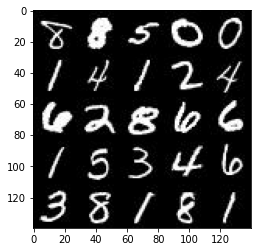

In [3]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

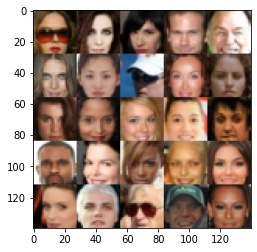

In [4]:
show_n_images = 25

mnist_images = get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
%tensorflow_version 1.x
# on Colab change runtime type to GPU, please

from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow 1.x selected.
TensorFlow Version: 1.15.2
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [0]:
from copy import deepcopy
from unittest import mock
import tensorflow as tf

# Modules

def test_safe(func):
    """
    Isolate tests
    """
    def func_wrapper(*args):
        with tf.Graph().as_default():
            result = func(*args)
        print('Tests Passed')
        return result

    return func_wrapper


def _assert_tensor_shape(tensor, shape, display_name):
    assert tf.assert_rank(tensor, len(shape), message='{} has wrong rank'.format(display_name))

    tensor_shape = tensor.get_shape().as_list() if len(shape) else []

    wrong_dimension = [ten_dim for ten_dim, cor_dim in zip(tensor_shape, shape)
                       if cor_dim is not None and ten_dim != cor_dim]
    assert not wrong_dimension, \
        '{} has wrong shape.  Found {}'.format(display_name, tensor_shape)


def _check_input(tensor, shape, display_name, tf_name=None):
    assert tensor.op.type == 'Placeholder', \
        '{} is not a Placeholder.'.format(display_name)

    _assert_tensor_shape(tensor, shape, 'Real Input')

    if tf_name:
        assert tensor.name == tf_name, \
            '{} has bad name.  Found name {}'.format(display_name, tensor.name)


class TmpMock():
    """
    Mock a attribute.  Restore attribute when exiting scope.
    """
    def __init__(self, module, attrib_name):
        self.original_attrib = deepcopy(getattr(module, attrib_name))
        setattr(module, attrib_name, mock.MagicMock())
        self.module = module
        self.attrib_name = attrib_name

    def __enter__(self):
        return getattr(self.module, self.attrib_name)

    def __exit__(self, type, value, traceback):
        setattr(self.module, self.attrib_name, self.original_attrib)


@test_safe
def test_model_inputs(model_inputs):
    image_width = 28
    image_height = 28
    image_channels = 3
    z_dim = 100
    input_real, input_z, learn_rate = model_inputs(image_width, image_height, image_channels, z_dim)

    _check_input(input_real, [None, image_width, image_height, image_channels], 'Real Input')
    _check_input(input_z, [None, z_dim], 'Z Input')
    _check_input(learn_rate, [], 'Learning Rate')


@test_safe
def test_discriminator(discriminator, tf_module):
    with TmpMock(tf_module, 'variable_scope') as mock_variable_scope:
        image = tf.placeholder(tf.float32, [None, 28, 28, 3])

        output, logits = discriminator(image)
        _assert_tensor_shape(output, [None, 1], 'Discriminator Training(reuse=false) output')
        _assert_tensor_shape(logits, [None, 1], 'Discriminator Training(reuse=false) Logits')
        assert mock_variable_scope.called,\
            'tf.variable_scope not called in Discriminator Training(reuse=false)'
        assert mock_variable_scope.call_args == mock.call('discriminator', reuse=False), \
            'tf.variable_scope called with wrong arguments in Discriminator Training(reuse=false)'

        mock_variable_scope.reset_mock()

        output_reuse, logits_reuse = discriminator(image, True)
        _assert_tensor_shape(output_reuse, [None, 1], 'Discriminator Inference(reuse=True) output')
        _assert_tensor_shape(logits_reuse, [None, 1], 'Discriminator Inference(reuse=True) Logits')
        assert mock_variable_scope.called, \
            'tf.variable_scope not called in Discriminator Inference(reuse=True)'
        assert mock_variable_scope.call_args == mock.call('discriminator', reuse=True), \
            'tf.variable_scope called with wrong arguments in Discriminator Inference(reuse=True)'


@test_safe
def test_generator(generator, tf_module):
    with TmpMock(tf_module, 'variable_scope') as mock_variable_scope:
        z = tf.placeholder(tf.float32, [None, 100])
        out_channel_dim = 5

        output = generator(z, out_channel_dim)
        _assert_tensor_shape(output, [None, 28, 28, out_channel_dim], 'Generator output (is_train=True)')
        assert mock_variable_scope.called, \
            'tf.variable_scope not called in Generator Training(reuse=false)'
        assert mock_variable_scope.call_args == mock.call('generator', reuse=False), \
            'tf.variable_scope called with wrong arguments in Generator Training(reuse=false)'

        mock_variable_scope.reset_mock()
        output = generator(z, out_channel_dim, False)
        _assert_tensor_shape(output, [None, 28, 28, out_channel_dim], 'Generator output (is_train=False)')
        assert mock_variable_scope.called, \
            'tf.variable_scope not called in Generator Inference(reuse=True)'
        assert mock_variable_scope.call_args == mock.call('generator', reuse=True), \
            'tf.variable_scope called with wrong arguments in Generator Inference(reuse=True)'


@test_safe
def test_model_loss(model_loss):
    out_channel_dim = 4
    input_real = tf.placeholder(tf.float32, [None, 28, 28, out_channel_dim])
    input_z = tf.placeholder(tf.float32, [None, 100])

    d_loss, g_loss = model_loss(input_real, input_z, out_channel_dim)

    _assert_tensor_shape(d_loss, [], 'Discriminator Loss')
    _assert_tensor_shape(d_loss, [], 'Generator Loss')


@test_safe
def test_model_opt(model_opt, tf_module):
    with TmpMock(tf_module, 'trainable_variables') as mock_trainable_variables:
        with tf.variable_scope('discriminator'):
            discriminator_logits = tf.Variable(tf.zeros([3, 3]))
        with tf.variable_scope('generator'):
            generator_logits = tf.Variable(tf.zeros([3, 3]))

        mock_trainable_variables.return_value = [discriminator_logits, generator_logits]
        d_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
            logits=discriminator_logits,
            labels=[[0.0, 0.0, 1.0], [0.0, 1.0, 0.0], [1.0, 0.0, 0.0]]))
        g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
            logits=generator_logits,
            labels=[[0.0, 0.0, 1.0], [0.0, 1.0, 0.0], [1.0, 0.0, 0.0]]))
        learning_rate = 0.001
        beta1 = 0.9

        d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
        assert mock_trainable_variables.called,\
            'tf.mock_trainable_variables not called'

In [7]:
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input_images = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], 'real_input_images')
    input_z = tf.placeholder(tf.float32, [None, z_dim], 'input_z')
    learning_rate = tf.placeholder(tf.float32, [], 'learning_rate')
    return real_input_images, input_z, learning_rate

test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use `tf.variable_scope` with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [8]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=0.5):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28xn
        # Convolutional layer, 14x14x64
        conv1 = tf.layers.conv2d(images, 64, 5, 2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        lrelu1 = tf.maximum(alpha * conv1, conv1)
        drop1 = tf.layers.dropout(lrelu1, keep_prob)
        
        # Strided convolutional layer, 7x7x128
        conv2 = tf.layers.conv2d(drop1, 128, 5, 2, 'same', use_bias=False)
        bn2 = tf.layers.batch_normalization(conv2)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        drop2 = tf.layers.dropout(lrelu2, keep_prob)
        
        # Strided convolutional layer, 4x4x256
        conv3 = tf.layers.conv2d(drop2, 256, 5, 2, 'same', use_bias=False)
        bn3 = tf.layers.batch_normalization(conv3)
        lrelu3 = tf.maximum(alpha * bn3, bn3)
        drop3 = tf.layers.dropout(lrelu3, keep_prob)
        
        # fully connected
        flat = tf.reshape(drop3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

test_discriminator(discriminator, tf)

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Use keras.layers.dropout instead.
Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.batch_normalization` documentation).
Instructions for updating:
Use keras.layers.Dense instead.
Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use `tf.variable_scope` with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [9]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, keep_prob=0.5):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=(not is_train)):
        # First fully connected layer, 4x4x1024
        fc = tf.layers.dense(z, 4*4*1024, use_bias=False)
        fc = tf.reshape(fc, (-1, 4, 4, 1024))
        bn0 = tf.layers.batch_normalization(fc, training=is_train)
        lrelu0 = tf.maximum(alpha * bn0, bn0)
        drop0 = tf.layers.dropout(lrelu0, keep_prob, training=is_train)
        
        # Deconvolution, 7x7x512
        conv1 = tf.layers.conv2d_transpose(drop0, 512, 4, 1, 'valid', use_bias=False)
        bn1 = tf.layers.batch_normalization(conv1, training=is_train)
        lrelu1 = tf.maximum(alpha * bn1, bn1)
        drop1 = tf.layers.dropout(lrelu1, keep_prob, training=is_train)
        
        # Deconvolution, 14x14x256
        conv2 = tf.layers.conv2d_transpose(drop1, 256, 5, 2, 'same', use_bias=False)
        bn2 = tf.layers.batch_normalization(conv2, training=is_train)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        drop2 = tf.layers.dropout(lrelu2, keep_prob, training=is_train)
        
        # Output layer, 28x28xn
        logits = tf.layers.conv2d_transpose(drop2, out_channel_dim, 5, 2, 'same')
        
        out = tf.tanh(logits)
        
        return out

test_generator(generator, tf)

Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, smooth_factor=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                labels=tf.ones_like(d_model_real) * (1 - smooth_factor)))
    
    input_fake = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(input_fake, reuse=True, alpha=alpha)
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    return d_loss_real + d_loss_fake, g_loss

test_model_loss(model_loss)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use `tf.trainable_variables` to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [0]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [0]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode,
          print_every=10, show_every=100):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, _ = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3], alpha=0.2)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2.0
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                sess.run(g_train_opt, feed_dict={input_z: batch_z})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, steps),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))  

                if steps % show_every == 0:
                    # Show example output for the generator
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode) 

### MNIST
Test your GANs architecture on MNIST.  After 3 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/3 Step 10... Discriminator Loss: 1.1528... Generator Loss: 0.7770
Epoch 1/3 Step 20... Discriminator Loss: 1.4677... Generator Loss: 0.6253
Epoch 1/3 Step 30... Discriminator Loss: 1.1063... Generator Loss: 0.8456
Epoch 1/3 Step 40... Discriminator Loss: 1.2065... Generator Loss: 0.8550
Epoch 1/3 Step 50... Discriminator Loss: 0.9483... Generator Loss: 1.1980
Epoch 1/3 Step 60... Discriminator Loss: 0.8566... Generator Loss: 1.1345
Epoch 1/3 Step 70... Discriminator Loss: 0.9511... Generator Loss: 1.2327
Epoch 1/3 Step 80... Discriminator Loss: 0.7893... Generator Loss: 1.4569
Epoch 1/3 Step 90... Discriminator Loss: 1.0826... Generator Loss: 1.1613
Epoch 1/3 Step 100... Discriminator Loss: 1.3102... Generator Loss: 1.3756


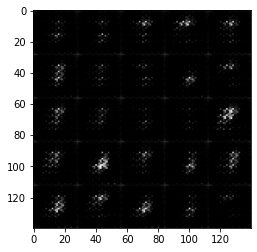

Epoch 1/3 Step 110... Discriminator Loss: 1.1853... Generator Loss: 1.0172
Epoch 1/3 Step 120... Discriminator Loss: 1.1393... Generator Loss: 0.9978
Epoch 1/3 Step 130... Discriminator Loss: 1.2207... Generator Loss: 0.9811
Epoch 1/3 Step 140... Discriminator Loss: 1.0019... Generator Loss: 1.1617
Epoch 1/3 Step 150... Discriminator Loss: 1.2642... Generator Loss: 1.1903
Epoch 1/3 Step 160... Discriminator Loss: 1.1144... Generator Loss: 1.2234
Epoch 1/3 Step 170... Discriminator Loss: 1.4791... Generator Loss: 0.5001
Epoch 1/3 Step 180... Discriminator Loss: 1.3338... Generator Loss: 0.7062
Epoch 1/3 Step 190... Discriminator Loss: 1.1213... Generator Loss: 1.1556
Epoch 1/3 Step 200... Discriminator Loss: 1.5084... Generator Loss: 1.0378


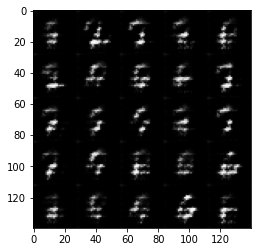

Epoch 1/3 Step 210... Discriminator Loss: 1.3386... Generator Loss: 1.0459
Epoch 1/3 Step 220... Discriminator Loss: 1.3443... Generator Loss: 0.6651
Epoch 1/3 Step 230... Discriminator Loss: 0.8119... Generator Loss: 1.4929
Epoch 1/3 Step 240... Discriminator Loss: 1.3189... Generator Loss: 1.6208
Epoch 1/3 Step 250... Discriminator Loss: 1.4313... Generator Loss: 0.7300
Epoch 1/3 Step 260... Discriminator Loss: 1.3009... Generator Loss: 1.0116
Epoch 1/3 Step 270... Discriminator Loss: 1.1469... Generator Loss: 1.1364
Epoch 1/3 Step 280... Discriminator Loss: 1.1051... Generator Loss: 0.9855
Epoch 1/3 Step 290... Discriminator Loss: 1.1686... Generator Loss: 1.0842
Epoch 1/3 Step 300... Discriminator Loss: 1.0353... Generator Loss: 1.0343


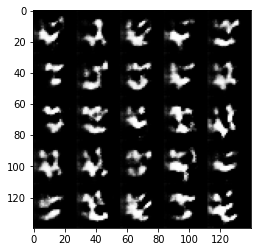

Epoch 1/3 Step 310... Discriminator Loss: 0.9317... Generator Loss: 1.3601
Epoch 1/3 Step 320... Discriminator Loss: 1.0238... Generator Loss: 1.1171
Epoch 1/3 Step 330... Discriminator Loss: 1.2203... Generator Loss: 1.2859
Epoch 1/3 Step 340... Discriminator Loss: 1.2194... Generator Loss: 1.1465
Epoch 1/3 Step 350... Discriminator Loss: 1.1234... Generator Loss: 1.1874
Epoch 1/3 Step 360... Discriminator Loss: 1.3971... Generator Loss: 1.0351
Epoch 1/3 Step 370... Discriminator Loss: 1.0237... Generator Loss: 1.2275
Epoch 1/3 Step 380... Discriminator Loss: 1.0664... Generator Loss: 0.9325
Epoch 1/3 Step 390... Discriminator Loss: 1.1053... Generator Loss: 1.0660
Epoch 1/3 Step 400... Discriminator Loss: 1.1462... Generator Loss: 0.9871


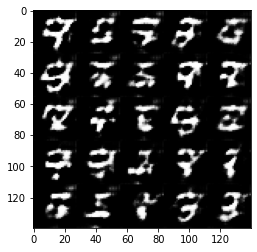

Epoch 1/3 Step 410... Discriminator Loss: 1.2360... Generator Loss: 1.0936
Epoch 1/3 Step 420... Discriminator Loss: 1.2832... Generator Loss: 1.2341
Epoch 1/3 Step 430... Discriminator Loss: 1.3895... Generator Loss: 0.5450
Epoch 1/3 Step 440... Discriminator Loss: 0.9587... Generator Loss: 1.3250
Epoch 1/3 Step 450... Discriminator Loss: 1.1362... Generator Loss: 1.2036
Epoch 1/3 Step 460... Discriminator Loss: 1.1236... Generator Loss: 1.0496
Epoch 1/3 Step 470... Discriminator Loss: 1.3687... Generator Loss: 0.5135
Epoch 1/3 Step 480... Discriminator Loss: 1.1783... Generator Loss: 1.0235
Epoch 1/3 Step 490... Discriminator Loss: 1.1208... Generator Loss: 0.9533
Epoch 1/3 Step 500... Discriminator Loss: 1.2912... Generator Loss: 1.1585


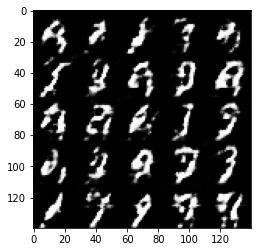

Epoch 1/3 Step 510... Discriminator Loss: 1.1422... Generator Loss: 1.1561
Epoch 1/3 Step 520... Discriminator Loss: 1.1029... Generator Loss: 0.9427
Epoch 1/3 Step 530... Discriminator Loss: 1.3998... Generator Loss: 2.0233
Epoch 1/3 Step 540... Discriminator Loss: 1.1995... Generator Loss: 1.3445
Epoch 1/3 Step 550... Discriminator Loss: 1.0625... Generator Loss: 0.9774
Epoch 1/3 Step 560... Discriminator Loss: 1.1759... Generator Loss: 0.6838
Epoch 1/3 Step 570... Discriminator Loss: 1.1717... Generator Loss: 0.8244
Epoch 1/3 Step 580... Discriminator Loss: 1.2847... Generator Loss: 0.7262
Epoch 1/3 Step 590... Discriminator Loss: 1.0704... Generator Loss: 1.4712
Epoch 1/3 Step 600... Discriminator Loss: 1.0310... Generator Loss: 1.4330


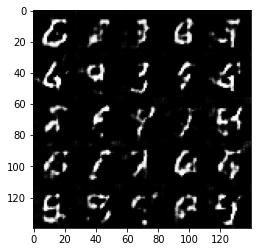

Epoch 1/3 Step 610... Discriminator Loss: 1.1343... Generator Loss: 1.0613
Epoch 1/3 Step 620... Discriminator Loss: 0.9975... Generator Loss: 1.1723
Epoch 1/3 Step 630... Discriminator Loss: 1.1139... Generator Loss: 1.3199
Epoch 1/3 Step 640... Discriminator Loss: 1.1675... Generator Loss: 1.0809
Epoch 1/3 Step 650... Discriminator Loss: 1.0567... Generator Loss: 1.0175
Epoch 1/3 Step 660... Discriminator Loss: 1.1860... Generator Loss: 0.8948
Epoch 1/3 Step 670... Discriminator Loss: 1.1111... Generator Loss: 1.0762
Epoch 1/3 Step 680... Discriminator Loss: 1.0436... Generator Loss: 1.1528
Epoch 1/3 Step 690... Discriminator Loss: 1.2866... Generator Loss: 0.6551
Epoch 1/3 Step 700... Discriminator Loss: 1.3085... Generator Loss: 0.6219


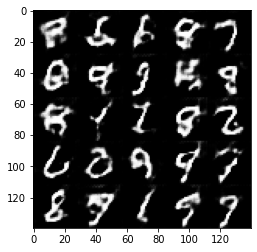

Epoch 1/3 Step 710... Discriminator Loss: 1.0309... Generator Loss: 1.1068
Epoch 1/3 Step 720... Discriminator Loss: 1.1125... Generator Loss: 1.3696
Epoch 1/3 Step 730... Discriminator Loss: 1.2125... Generator Loss: 1.0221
Epoch 1/3 Step 740... Discriminator Loss: 1.2777... Generator Loss: 1.2269
Epoch 1/3 Step 750... Discriminator Loss: 1.3195... Generator Loss: 0.9709
Epoch 1/3 Step 760... Discriminator Loss: 1.1271... Generator Loss: 1.1573
Epoch 1/3 Step 770... Discriminator Loss: 1.1110... Generator Loss: 1.1247
Epoch 1/3 Step 780... Discriminator Loss: 1.2082... Generator Loss: 0.9724
Epoch 1/3 Step 790... Discriminator Loss: 1.3724... Generator Loss: 0.9279
Epoch 1/3 Step 800... Discriminator Loss: 1.1292... Generator Loss: 1.1546


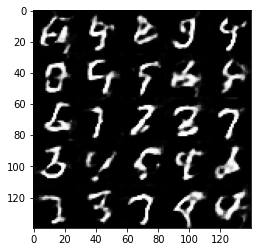

Epoch 1/3 Step 810... Discriminator Loss: 1.0185... Generator Loss: 1.1037
Epoch 1/3 Step 820... Discriminator Loss: 1.1721... Generator Loss: 0.9122
Epoch 1/3 Step 830... Discriminator Loss: 1.2790... Generator Loss: 0.9726
Epoch 1/3 Step 840... Discriminator Loss: 1.1452... Generator Loss: 1.3015
Epoch 1/3 Step 850... Discriminator Loss: 1.1798... Generator Loss: 1.5508
Epoch 1/3 Step 860... Discriminator Loss: 1.1504... Generator Loss: 0.9659
Epoch 1/3 Step 870... Discriminator Loss: 1.2159... Generator Loss: 0.9158
Epoch 1/3 Step 880... Discriminator Loss: 1.0603... Generator Loss: 1.1829
Epoch 1/3 Step 890... Discriminator Loss: 1.1938... Generator Loss: 1.2584
Epoch 1/3 Step 900... Discriminator Loss: 1.2410... Generator Loss: 0.8531


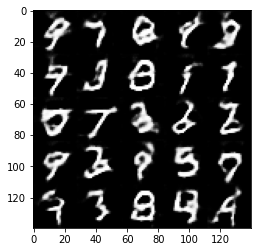

Epoch 1/3 Step 910... Discriminator Loss: 1.2851... Generator Loss: 0.6791
Epoch 1/3 Step 920... Discriminator Loss: 1.0912... Generator Loss: 1.2110
Epoch 1/3 Step 930... Discriminator Loss: 1.1494... Generator Loss: 1.1254
Epoch 2/3 Step 940... Discriminator Loss: 1.3125... Generator Loss: 0.7697
Epoch 2/3 Step 950... Discriminator Loss: 1.3248... Generator Loss: 0.9218
Epoch 2/3 Step 960... Discriminator Loss: 1.1876... Generator Loss: 1.1046
Epoch 2/3 Step 970... Discriminator Loss: 1.1105... Generator Loss: 1.1163
Epoch 2/3 Step 980... Discriminator Loss: 1.1639... Generator Loss: 1.1369
Epoch 2/3 Step 990... Discriminator Loss: 1.2122... Generator Loss: 0.9992
Epoch 2/3 Step 1000... Discriminator Loss: 1.1566... Generator Loss: 1.4089


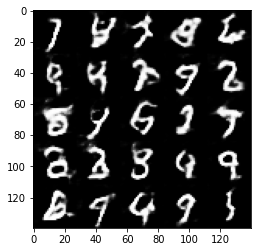

Epoch 2/3 Step 1010... Discriminator Loss: 1.0782... Generator Loss: 1.1292
Epoch 2/3 Step 1020... Discriminator Loss: 1.3204... Generator Loss: 1.9582
Epoch 2/3 Step 1030... Discriminator Loss: 1.1896... Generator Loss: 1.0225
Epoch 2/3 Step 1040... Discriminator Loss: 1.1354... Generator Loss: 0.9918
Epoch 2/3 Step 1050... Discriminator Loss: 1.3478... Generator Loss: 0.5985
Epoch 2/3 Step 1060... Discriminator Loss: 1.1796... Generator Loss: 1.0512
Epoch 2/3 Step 1070... Discriminator Loss: 1.0584... Generator Loss: 0.9632
Epoch 2/3 Step 1080... Discriminator Loss: 1.1677... Generator Loss: 1.1566
Epoch 2/3 Step 1090... Discriminator Loss: 1.1130... Generator Loss: 0.7928
Epoch 2/3 Step 1100... Discriminator Loss: 1.2611... Generator Loss: 1.2529


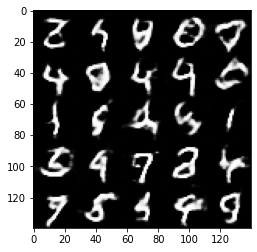

Epoch 2/3 Step 1110... Discriminator Loss: 1.0526... Generator Loss: 1.1472
Epoch 2/3 Step 1120... Discriminator Loss: 1.2748... Generator Loss: 0.6768
Epoch 2/3 Step 1130... Discriminator Loss: 1.0924... Generator Loss: 1.0512
Epoch 2/3 Step 1140... Discriminator Loss: 1.1379... Generator Loss: 0.9293
Epoch 2/3 Step 1150... Discriminator Loss: 1.1083... Generator Loss: 1.2766
Epoch 2/3 Step 1160... Discriminator Loss: 1.2740... Generator Loss: 0.6465
Epoch 2/3 Step 1170... Discriminator Loss: 1.1279... Generator Loss: 0.8221
Epoch 2/3 Step 1180... Discriminator Loss: 1.2110... Generator Loss: 1.5817
Epoch 2/3 Step 1190... Discriminator Loss: 1.1130... Generator Loss: 1.4024
Epoch 2/3 Step 1200... Discriminator Loss: 1.0414... Generator Loss: 1.2748


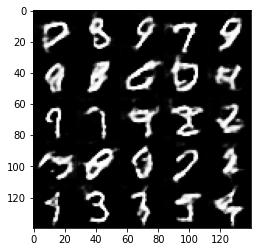

Epoch 2/3 Step 1210... Discriminator Loss: 1.1293... Generator Loss: 1.0519
Epoch 2/3 Step 1220... Discriminator Loss: 1.2404... Generator Loss: 1.4195
Epoch 2/3 Step 1230... Discriminator Loss: 1.2166... Generator Loss: 0.6979
Epoch 2/3 Step 1240... Discriminator Loss: 1.1235... Generator Loss: 0.9852
Epoch 2/3 Step 1250... Discriminator Loss: 1.1503... Generator Loss: 1.2132
Epoch 2/3 Step 1260... Discriminator Loss: 1.0623... Generator Loss: 1.0703
Epoch 2/3 Step 1270... Discriminator Loss: 1.0486... Generator Loss: 1.3080
Epoch 2/3 Step 1280... Discriminator Loss: 1.0357... Generator Loss: 1.1055
Epoch 2/3 Step 1290... Discriminator Loss: 1.2543... Generator Loss: 0.8761
Epoch 2/3 Step 1300... Discriminator Loss: 1.2248... Generator Loss: 1.0979


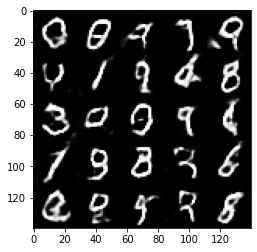

Epoch 2/3 Step 1310... Discriminator Loss: 1.1231... Generator Loss: 1.1109
Epoch 2/3 Step 1320... Discriminator Loss: 1.0778... Generator Loss: 1.0084
Epoch 2/3 Step 1330... Discriminator Loss: 1.0444... Generator Loss: 1.0577
Epoch 2/3 Step 1340... Discriminator Loss: 1.0758... Generator Loss: 1.1858
Epoch 2/3 Step 1350... Discriminator Loss: 1.1177... Generator Loss: 0.8851
Epoch 2/3 Step 1360... Discriminator Loss: 1.0560... Generator Loss: 0.9251
Epoch 2/3 Step 1370... Discriminator Loss: 1.1041... Generator Loss: 0.9023
Epoch 2/3 Step 1380... Discriminator Loss: 1.1969... Generator Loss: 0.8059
Epoch 2/3 Step 1390... Discriminator Loss: 1.0484... Generator Loss: 1.0020
Epoch 2/3 Step 1400... Discriminator Loss: 1.4148... Generator Loss: 2.0371


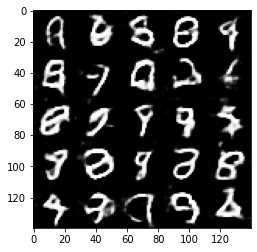

Epoch 2/3 Step 1410... Discriminator Loss: 1.1015... Generator Loss: 1.2018
Epoch 2/3 Step 1420... Discriminator Loss: 1.1703... Generator Loss: 1.6958
Epoch 2/3 Step 1430... Discriminator Loss: 1.0317... Generator Loss: 1.1384
Epoch 2/3 Step 1440... Discriminator Loss: 1.0856... Generator Loss: 1.0527
Epoch 2/3 Step 1450... Discriminator Loss: 1.1571... Generator Loss: 0.7662
Epoch 2/3 Step 1460... Discriminator Loss: 1.0606... Generator Loss: 1.2129
Epoch 2/3 Step 1470... Discriminator Loss: 1.0455... Generator Loss: 1.1156
Epoch 2/3 Step 1480... Discriminator Loss: 1.1236... Generator Loss: 1.4344
Epoch 2/3 Step 1490... Discriminator Loss: 1.1395... Generator Loss: 1.4765
Epoch 2/3 Step 1500... Discriminator Loss: 1.0139... Generator Loss: 1.0702


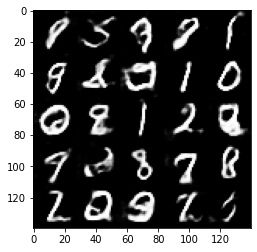

Epoch 2/3 Step 1510... Discriminator Loss: 1.0080... Generator Loss: 1.2349
Epoch 2/3 Step 1520... Discriminator Loss: 1.0681... Generator Loss: 0.9856
Epoch 2/3 Step 1530... Discriminator Loss: 1.1010... Generator Loss: 0.8883
Epoch 2/3 Step 1540... Discriminator Loss: 1.0187... Generator Loss: 1.0503
Epoch 2/3 Step 1550... Discriminator Loss: 1.0656... Generator Loss: 1.3310
Epoch 2/3 Step 1560... Discriminator Loss: 1.3175... Generator Loss: 0.5799
Epoch 2/3 Step 1570... Discriminator Loss: 1.0738... Generator Loss: 0.9964
Epoch 2/3 Step 1580... Discriminator Loss: 1.0189... Generator Loss: 1.3370
Epoch 2/3 Step 1590... Discriminator Loss: 1.0381... Generator Loss: 1.3129
Epoch 2/3 Step 1600... Discriminator Loss: 1.0730... Generator Loss: 0.9628


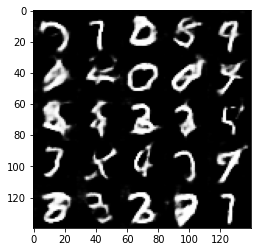

Epoch 2/3 Step 1610... Discriminator Loss: 1.0320... Generator Loss: 0.9755
Epoch 2/3 Step 1620... Discriminator Loss: 1.0350... Generator Loss: 1.1595
Epoch 2/3 Step 1630... Discriminator Loss: 1.1910... Generator Loss: 0.8501
Epoch 2/3 Step 1640... Discriminator Loss: 1.1501... Generator Loss: 0.9846
Epoch 2/3 Step 1650... Discriminator Loss: 1.1739... Generator Loss: 1.3083
Epoch 2/3 Step 1660... Discriminator Loss: 1.1837... Generator Loss: 1.0818
Epoch 2/3 Step 1670... Discriminator Loss: 1.1690... Generator Loss: 1.4173
Epoch 2/3 Step 1680... Discriminator Loss: 1.1475... Generator Loss: 0.8741
Epoch 2/3 Step 1690... Discriminator Loss: 1.0031... Generator Loss: 1.6895
Epoch 2/3 Step 1700... Discriminator Loss: 1.2154... Generator Loss: 0.8581


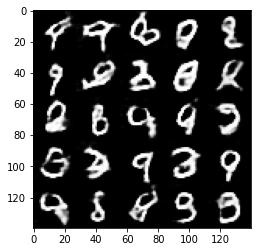

Epoch 2/3 Step 1710... Discriminator Loss: 1.0196... Generator Loss: 1.3428
Epoch 2/3 Step 1720... Discriminator Loss: 1.0621... Generator Loss: 1.0304
Epoch 2/3 Step 1730... Discriminator Loss: 1.1874... Generator Loss: 0.8501
Epoch 2/3 Step 1740... Discriminator Loss: 1.0772... Generator Loss: 1.6163
Epoch 2/3 Step 1750... Discriminator Loss: 1.1664... Generator Loss: 0.7806
Epoch 2/3 Step 1760... Discriminator Loss: 1.0087... Generator Loss: 1.1408
Epoch 2/3 Step 1770... Discriminator Loss: 1.0201... Generator Loss: 0.9954
Epoch 2/3 Step 1780... Discriminator Loss: 1.0712... Generator Loss: 1.5404
Epoch 2/3 Step 1790... Discriminator Loss: 1.0873... Generator Loss: 0.8490
Epoch 2/3 Step 1800... Discriminator Loss: 1.0708... Generator Loss: 1.0799


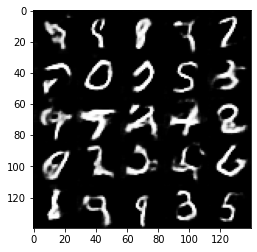

Epoch 2/3 Step 1810... Discriminator Loss: 1.0401... Generator Loss: 1.0818
Epoch 2/3 Step 1820... Discriminator Loss: 1.0637... Generator Loss: 0.9603
Epoch 2/3 Step 1830... Discriminator Loss: 1.1925... Generator Loss: 2.0633
Epoch 2/3 Step 1840... Discriminator Loss: 1.1279... Generator Loss: 0.7575
Epoch 2/3 Step 1850... Discriminator Loss: 1.1090... Generator Loss: 0.9893
Epoch 2/3 Step 1860... Discriminator Loss: 1.0123... Generator Loss: 1.7999
Epoch 2/3 Step 1870... Discriminator Loss: 1.0265... Generator Loss: 1.3899
Epoch 3/3 Step 1880... Discriminator Loss: 1.0856... Generator Loss: 1.4241
Epoch 3/3 Step 1890... Discriminator Loss: 1.0350... Generator Loss: 1.0286
Epoch 3/3 Step 1900... Discriminator Loss: 1.0887... Generator Loss: 1.1757


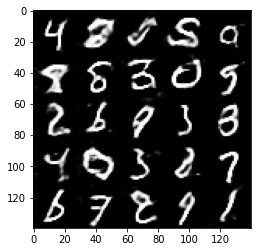

Epoch 3/3 Step 1910... Discriminator Loss: 1.0420... Generator Loss: 1.6773
Epoch 3/3 Step 1920... Discriminator Loss: 1.0357... Generator Loss: 1.4130
Epoch 3/3 Step 1930... Discriminator Loss: 0.9926... Generator Loss: 1.7283
Epoch 3/3 Step 1940... Discriminator Loss: 1.0021... Generator Loss: 1.5637
Epoch 3/3 Step 1950... Discriminator Loss: 1.0665... Generator Loss: 0.7972
Epoch 3/3 Step 1960... Discriminator Loss: 1.1264... Generator Loss: 0.9429
Epoch 3/3 Step 1970... Discriminator Loss: 1.0361... Generator Loss: 1.2297
Epoch 3/3 Step 1980... Discriminator Loss: 1.0520... Generator Loss: 1.1836
Epoch 3/3 Step 1990... Discriminator Loss: 0.9628... Generator Loss: 1.1665
Epoch 3/3 Step 2000... Discriminator Loss: 1.0119... Generator Loss: 1.1454


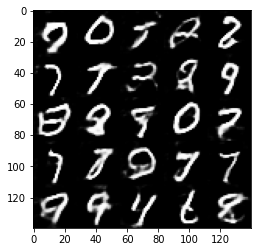

Epoch 3/3 Step 2010... Discriminator Loss: 0.9980... Generator Loss: 1.2020
Epoch 3/3 Step 2020... Discriminator Loss: 1.2468... Generator Loss: 0.7270
Epoch 3/3 Step 2030... Discriminator Loss: 1.0530... Generator Loss: 1.6281
Epoch 3/3 Step 2040... Discriminator Loss: 1.0223... Generator Loss: 1.1038
Epoch 3/3 Step 2050... Discriminator Loss: 0.9873... Generator Loss: 1.0174
Epoch 3/3 Step 2060... Discriminator Loss: 1.0308... Generator Loss: 1.3481
Epoch 3/3 Step 2070... Discriminator Loss: 0.9873... Generator Loss: 1.1750
Epoch 3/3 Step 2080... Discriminator Loss: 1.0548... Generator Loss: 1.1843
Epoch 3/3 Step 2090... Discriminator Loss: 0.9618... Generator Loss: 1.0938
Epoch 3/3 Step 2100... Discriminator Loss: 1.0277... Generator Loss: 1.7944


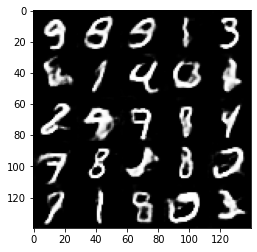

Epoch 3/3 Step 2110... Discriminator Loss: 0.9777... Generator Loss: 1.5416
Epoch 3/3 Step 2120... Discriminator Loss: 0.9337... Generator Loss: 1.4300
Epoch 3/3 Step 2130... Discriminator Loss: 1.0912... Generator Loss: 1.6374
Epoch 3/3 Step 2140... Discriminator Loss: 1.0240... Generator Loss: 1.1901
Epoch 3/3 Step 2150... Discriminator Loss: 1.0058... Generator Loss: 1.4055
Epoch 3/3 Step 2160... Discriminator Loss: 0.9835... Generator Loss: 1.4810
Epoch 3/3 Step 2170... Discriminator Loss: 0.9835... Generator Loss: 1.0885
Epoch 3/3 Step 2180... Discriminator Loss: 1.0079... Generator Loss: 1.7575
Epoch 3/3 Step 2190... Discriminator Loss: 1.0641... Generator Loss: 1.0005
Epoch 3/3 Step 2200... Discriminator Loss: 0.9566... Generator Loss: 1.3474


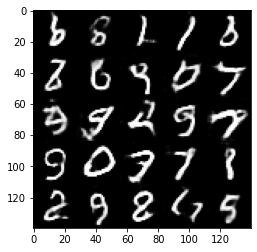

Epoch 3/3 Step 2210... Discriminator Loss: 1.1274... Generator Loss: 0.7912
Epoch 3/3 Step 2220... Discriminator Loss: 1.0073... Generator Loss: 1.3614
Epoch 3/3 Step 2230... Discriminator Loss: 0.9306... Generator Loss: 1.5832
Epoch 3/3 Step 2240... Discriminator Loss: 0.9701... Generator Loss: 1.2784
Epoch 3/3 Step 2250... Discriminator Loss: 1.0666... Generator Loss: 1.3964
Epoch 3/3 Step 2260... Discriminator Loss: 0.9888... Generator Loss: 1.1515
Epoch 3/3 Step 2270... Discriminator Loss: 0.9022... Generator Loss: 1.2415
Epoch 3/3 Step 2280... Discriminator Loss: 0.9699... Generator Loss: 1.1348
Epoch 3/3 Step 2290... Discriminator Loss: 1.0049... Generator Loss: 1.1264
Epoch 3/3 Step 2300... Discriminator Loss: 1.0313... Generator Loss: 1.0541


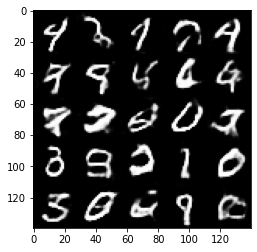

Epoch 3/3 Step 2310... Discriminator Loss: 0.9143... Generator Loss: 1.2494
Epoch 3/3 Step 2320... Discriminator Loss: 0.9661... Generator Loss: 1.2608
Epoch 3/3 Step 2330... Discriminator Loss: 0.9992... Generator Loss: 1.2746
Epoch 3/3 Step 2340... Discriminator Loss: 0.9592... Generator Loss: 1.0583
Epoch 3/3 Step 2350... Discriminator Loss: 0.8462... Generator Loss: 1.2670
Epoch 3/3 Step 2360... Discriminator Loss: 1.0223... Generator Loss: 1.4956
Epoch 3/3 Step 2370... Discriminator Loss: 1.1039... Generator Loss: 1.5564
Epoch 3/3 Step 2380... Discriminator Loss: 0.9846... Generator Loss: 1.5446
Epoch 3/3 Step 2390... Discriminator Loss: 1.0488... Generator Loss: 0.9731
Epoch 3/3 Step 2400... Discriminator Loss: 0.9731... Generator Loss: 1.6873


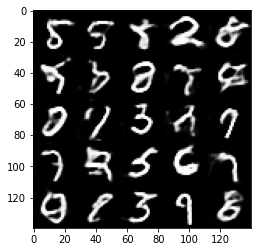

Epoch 3/3 Step 2410... Discriminator Loss: 0.9776... Generator Loss: 1.6814
Epoch 3/3 Step 2420... Discriminator Loss: 0.9562... Generator Loss: 1.3475
Epoch 3/3 Step 2430... Discriminator Loss: 0.9822... Generator Loss: 1.4924
Epoch 3/3 Step 2440... Discriminator Loss: 0.9838... Generator Loss: 1.5747
Epoch 3/3 Step 2450... Discriminator Loss: 1.0444... Generator Loss: 1.6118
Epoch 3/3 Step 2460... Discriminator Loss: 0.9435... Generator Loss: 1.2756
Epoch 3/3 Step 2470... Discriminator Loss: 0.9630... Generator Loss: 1.3341
Epoch 3/3 Step 2480... Discriminator Loss: 1.0244... Generator Loss: 2.1038
Epoch 3/3 Step 2490... Discriminator Loss: 0.8755... Generator Loss: 1.4052
Epoch 3/3 Step 2500... Discriminator Loss: 1.1134... Generator Loss: 2.5343


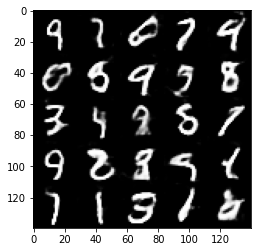

Epoch 3/3 Step 2510... Discriminator Loss: 1.0067... Generator Loss: 1.1259
Epoch 3/3 Step 2520... Discriminator Loss: 1.0638... Generator Loss: 0.9062
Epoch 3/3 Step 2530... Discriminator Loss: 0.8639... Generator Loss: 1.3494
Epoch 3/3 Step 2540... Discriminator Loss: 1.0101... Generator Loss: 1.0974
Epoch 3/3 Step 2550... Discriminator Loss: 1.0104... Generator Loss: 1.0362
Epoch 3/3 Step 2560... Discriminator Loss: 1.0322... Generator Loss: 1.0427
Epoch 3/3 Step 2570... Discriminator Loss: 0.9818... Generator Loss: 1.2934
Epoch 3/3 Step 2580... Discriminator Loss: 1.0879... Generator Loss: 0.9806
Epoch 3/3 Step 2590... Discriminator Loss: 1.1009... Generator Loss: 2.0057
Epoch 3/3 Step 2600... Discriminator Loss: 0.9828... Generator Loss: 1.1695


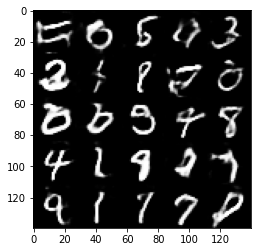

Epoch 3/3 Step 2610... Discriminator Loss: 0.9631... Generator Loss: 1.0679
Epoch 3/3 Step 2620... Discriminator Loss: 0.9085... Generator Loss: 1.5786
Epoch 3/3 Step 2630... Discriminator Loss: 0.9385... Generator Loss: 1.4828
Epoch 3/3 Step 2640... Discriminator Loss: 0.9565... Generator Loss: 1.4279
Epoch 3/3 Step 2650... Discriminator Loss: 0.9901... Generator Loss: 1.1296
Epoch 3/3 Step 2660... Discriminator Loss: 0.9473... Generator Loss: 1.3998
Epoch 3/3 Step 2670... Discriminator Loss: 0.9771... Generator Loss: 1.9780
Epoch 3/3 Step 2680... Discriminator Loss: 0.9157... Generator Loss: 1.8728
Epoch 3/3 Step 2690... Discriminator Loss: 1.0836... Generator Loss: 0.8051
Epoch 3/3 Step 2700... Discriminator Loss: 0.8904... Generator Loss: 1.7857


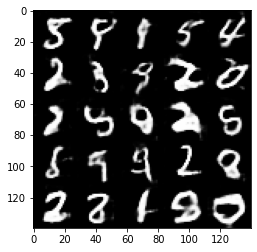

Epoch 3/3 Step 2710... Discriminator Loss: 0.9115... Generator Loss: 1.3439
Epoch 3/3 Step 2720... Discriminator Loss: 1.3631... Generator Loss: 2.4480
Epoch 3/3 Step 2730... Discriminator Loss: 0.9484... Generator Loss: 1.0025
Epoch 3/3 Step 2740... Discriminator Loss: 0.9479... Generator Loss: 2.1043
Epoch 3/3 Step 2750... Discriminator Loss: 1.2214... Generator Loss: 0.6677
Epoch 3/3 Step 2760... Discriminator Loss: 0.9757... Generator Loss: 1.0718
Epoch 3/3 Step 2770... Discriminator Loss: 0.9567... Generator Loss: 2.3707
Epoch 3/3 Step 2780... Discriminator Loss: 0.9446... Generator Loss: 1.5052
Epoch 3/3 Step 2790... Discriminator Loss: 0.9106... Generator Loss: 1.5032
Epoch 3/3 Step 2800... Discriminator Loss: 0.9046... Generator Loss: 1.4890


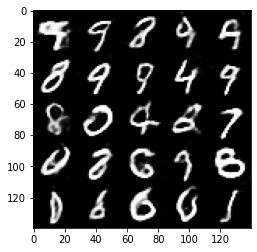

Epoch 3/3 Step 2810... Discriminator Loss: 0.8963... Generator Loss: 1.4892


In [14]:
batch_size = 64
z_dim = 100
learning_rate = 0.00025
beta1 = 0.45

epochs = 3

mnist_dataset = Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/3 Step 10... Discriminator Loss: 1.0187... Generator Loss: 1.1239
Epoch 1/3 Step 20... Discriminator Loss: 0.8130... Generator Loss: 1.6065
Epoch 1/3 Step 30... Discriminator Loss: 0.8709... Generator Loss: 1.3922
Epoch 1/3 Step 40... Discriminator Loss: 0.9983... Generator Loss: 1.5192
Epoch 1/3 Step 50... Discriminator Loss: 1.0875... Generator Loss: 1.2260
Epoch 1/3 Step 60... Discriminator Loss: 0.6859... Generator Loss: 2.0131
Epoch 1/3 Step 70... Discriminator Loss: 0.8213... Generator Loss: 1.8085
Epoch 1/3 Step 80... Discriminator Loss: 1.1401... Generator Loss: 1.0434
Epoch 1/3 Step 90... Discriminator Loss: 0.6990... Generator Loss: 1.7218
Epoch 1/3 Step 100... Discriminator Loss: 0.7432... Generator Loss: 1.5158


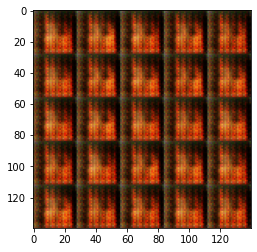

Epoch 1/3 Step 110... Discriminator Loss: 0.6870... Generator Loss: 1.3705
Epoch 1/3 Step 120... Discriminator Loss: 0.4970... Generator Loss: 2.5392
Epoch 1/3 Step 130... Discriminator Loss: 1.6217... Generator Loss: 0.4402
Epoch 1/3 Step 140... Discriminator Loss: 0.7545... Generator Loss: 1.3667
Epoch 1/3 Step 150... Discriminator Loss: 0.7356... Generator Loss: 1.9669
Epoch 1/3 Step 160... Discriminator Loss: 0.9392... Generator Loss: 2.0017
Epoch 1/3 Step 170... Discriminator Loss: 0.6329... Generator Loss: 2.1320
Epoch 1/3 Step 180... Discriminator Loss: 0.7793... Generator Loss: 1.8701
Epoch 1/3 Step 190... Discriminator Loss: 1.5674... Generator Loss: 2.4691
Epoch 1/3 Step 200... Discriminator Loss: 0.8061... Generator Loss: 1.6580


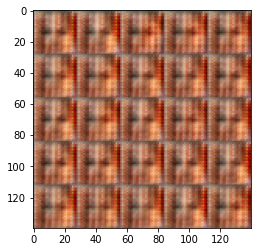

Epoch 1/3 Step 210... Discriminator Loss: 0.9368... Generator Loss: 1.3001
Epoch 1/3 Step 220... Discriminator Loss: 0.9019... Generator Loss: 1.3945
Epoch 1/3 Step 230... Discriminator Loss: 0.9426... Generator Loss: 1.2547
Epoch 1/3 Step 240... Discriminator Loss: 1.0978... Generator Loss: 0.8967
Epoch 1/3 Step 250... Discriminator Loss: 1.0622... Generator Loss: 1.2599
Epoch 1/3 Step 260... Discriminator Loss: 1.1934... Generator Loss: 0.9915
Epoch 1/3 Step 270... Discriminator Loss: 1.0375... Generator Loss: 1.1504
Epoch 1/3 Step 280... Discriminator Loss: 1.2686... Generator Loss: 0.7798
Epoch 1/3 Step 290... Discriminator Loss: 1.1904... Generator Loss: 1.2245
Epoch 1/3 Step 300... Discriminator Loss: 1.2131... Generator Loss: 0.8587


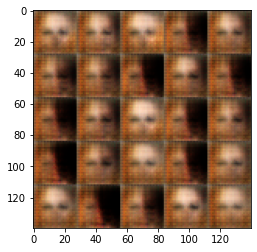

Epoch 1/3 Step 310... Discriminator Loss: 1.2764... Generator Loss: 0.7955
Epoch 1/3 Step 320... Discriminator Loss: 1.0523... Generator Loss: 0.9148
Epoch 1/3 Step 330... Discriminator Loss: 1.0733... Generator Loss: 1.1818
Epoch 1/3 Step 340... Discriminator Loss: 1.4912... Generator Loss: 0.8349
Epoch 1/3 Step 350... Discriminator Loss: 1.2394... Generator Loss: 1.0191
Epoch 1/3 Step 360... Discriminator Loss: 1.0469... Generator Loss: 1.1184
Epoch 1/3 Step 370... Discriminator Loss: 1.0779... Generator Loss: 1.1628
Epoch 1/3 Step 380... Discriminator Loss: 1.2644... Generator Loss: 1.1529
Epoch 1/3 Step 390... Discriminator Loss: 1.1370... Generator Loss: 1.0472
Epoch 1/3 Step 400... Discriminator Loss: 1.2050... Generator Loss: 0.8965


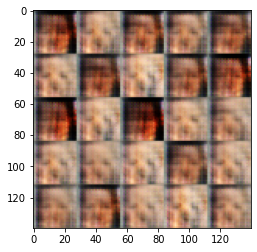

Epoch 1/3 Step 410... Discriminator Loss: 1.1588... Generator Loss: 1.0187
Epoch 1/3 Step 420... Discriminator Loss: 1.2111... Generator Loss: 0.8796
Epoch 1/3 Step 430... Discriminator Loss: 1.2018... Generator Loss: 1.0424
Epoch 1/3 Step 440... Discriminator Loss: 1.2541... Generator Loss: 1.0903
Epoch 1/3 Step 450... Discriminator Loss: 1.2569... Generator Loss: 0.8487
Epoch 1/3 Step 460... Discriminator Loss: 0.9931... Generator Loss: 1.2392
Epoch 1/3 Step 470... Discriminator Loss: 1.4167... Generator Loss: 0.8884
Epoch 1/3 Step 480... Discriminator Loss: 1.0998... Generator Loss: 1.1400
Epoch 1/3 Step 490... Discriminator Loss: 1.1454... Generator Loss: 1.0360
Epoch 1/3 Step 500... Discriminator Loss: 1.2298... Generator Loss: 0.9491


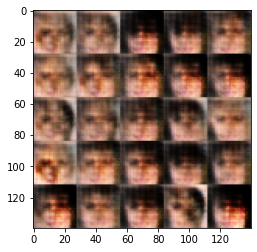

Epoch 1/3 Step 510... Discriminator Loss: 1.4288... Generator Loss: 0.8784
Epoch 1/3 Step 520... Discriminator Loss: 1.2137... Generator Loss: 0.9124
Epoch 1/3 Step 530... Discriminator Loss: 1.1596... Generator Loss: 1.0267
Epoch 1/3 Step 540... Discriminator Loss: 1.2418... Generator Loss: 0.8252
Epoch 1/3 Step 550... Discriminator Loss: 1.3390... Generator Loss: 0.8972
Epoch 1/3 Step 560... Discriminator Loss: 1.3501... Generator Loss: 0.8665
Epoch 1/3 Step 570... Discriminator Loss: 1.2303... Generator Loss: 1.2407
Epoch 1/3 Step 580... Discriminator Loss: 1.2071... Generator Loss: 0.8994
Epoch 1/3 Step 590... Discriminator Loss: 1.1836... Generator Loss: 0.9116
Epoch 1/3 Step 600... Discriminator Loss: 1.2217... Generator Loss: 0.9540


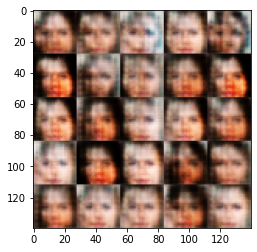

Epoch 1/3 Step 610... Discriminator Loss: 1.4176... Generator Loss: 0.7576
Epoch 1/3 Step 620... Discriminator Loss: 1.4583... Generator Loss: 0.8859
Epoch 1/3 Step 630... Discriminator Loss: 1.4331... Generator Loss: 0.8587
Epoch 1/3 Step 640... Discriminator Loss: 1.2298... Generator Loss: 0.9971
Epoch 1/3 Step 650... Discriminator Loss: 1.1867... Generator Loss: 0.9671
Epoch 1/3 Step 660... Discriminator Loss: 1.3276... Generator Loss: 0.8711
Epoch 1/3 Step 670... Discriminator Loss: 1.2783... Generator Loss: 0.8738
Epoch 1/3 Step 680... Discriminator Loss: 1.5985... Generator Loss: 0.8319
Epoch 1/3 Step 690... Discriminator Loss: 1.2300... Generator Loss: 0.9620
Epoch 1/3 Step 700... Discriminator Loss: 1.2814... Generator Loss: 1.0092


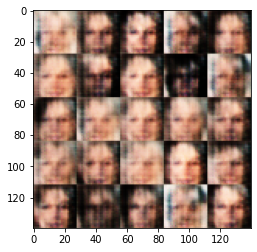

Epoch 1/3 Step 710... Discriminator Loss: 1.3186... Generator Loss: 0.8542
Epoch 1/3 Step 720... Discriminator Loss: 1.1956... Generator Loss: 0.9519
Epoch 1/3 Step 730... Discriminator Loss: 1.1466... Generator Loss: 1.0063
Epoch 1/3 Step 740... Discriminator Loss: 1.2221... Generator Loss: 0.8641
Epoch 1/3 Step 750... Discriminator Loss: 1.3171... Generator Loss: 0.7657
Epoch 1/3 Step 760... Discriminator Loss: 1.2881... Generator Loss: 0.9693
Epoch 1/3 Step 770... Discriminator Loss: 1.1654... Generator Loss: 0.9236
Epoch 1/3 Step 780... Discriminator Loss: 1.0869... Generator Loss: 1.0484
Epoch 1/3 Step 790... Discriminator Loss: 1.1884... Generator Loss: 0.9949
Epoch 1/3 Step 800... Discriminator Loss: 1.5501... Generator Loss: 0.7790


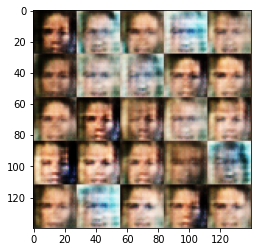

Epoch 1/3 Step 810... Discriminator Loss: 1.1184... Generator Loss: 1.0260
Epoch 1/3 Step 820... Discriminator Loss: 1.2659... Generator Loss: 0.9302
Epoch 1/3 Step 830... Discriminator Loss: 1.2941... Generator Loss: 0.8644
Epoch 1/3 Step 840... Discriminator Loss: 1.1074... Generator Loss: 1.1244
Epoch 1/3 Step 850... Discriminator Loss: 1.2496... Generator Loss: 0.8996
Epoch 1/3 Step 860... Discriminator Loss: 1.2808... Generator Loss: 0.8644
Epoch 1/3 Step 870... Discriminator Loss: 1.2406... Generator Loss: 0.9884
Epoch 1/3 Step 880... Discriminator Loss: 1.1905... Generator Loss: 0.8824
Epoch 1/3 Step 890... Discriminator Loss: 1.1208... Generator Loss: 1.0588
Epoch 1/3 Step 900... Discriminator Loss: 1.2414... Generator Loss: 0.9098


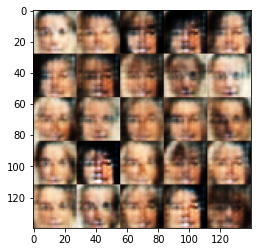

Epoch 1/3 Step 910... Discriminator Loss: 1.2183... Generator Loss: 0.8888
Epoch 1/3 Step 920... Discriminator Loss: 1.2220... Generator Loss: 0.9734
Epoch 1/3 Step 930... Discriminator Loss: 1.3045... Generator Loss: 0.8613
Epoch 1/3 Step 940... Discriminator Loss: 1.2712... Generator Loss: 0.8533
Epoch 1/3 Step 950... Discriminator Loss: 1.3068... Generator Loss: 0.8102
Epoch 1/3 Step 960... Discriminator Loss: 1.3148... Generator Loss: 0.9424
Epoch 1/3 Step 970... Discriminator Loss: 1.3302... Generator Loss: 0.8446
Epoch 1/3 Step 980... Discriminator Loss: 1.2259... Generator Loss: 0.9093
Epoch 1/3 Step 990... Discriminator Loss: 1.2627... Generator Loss: 0.9578
Epoch 1/3 Step 1000... Discriminator Loss: 1.3268... Generator Loss: 0.7657


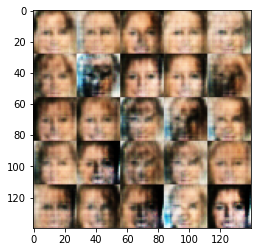

Epoch 1/3 Step 1010... Discriminator Loss: 1.3880... Generator Loss: 0.9127
Epoch 1/3 Step 1020... Discriminator Loss: 1.2813... Generator Loss: 0.8528
Epoch 1/3 Step 1030... Discriminator Loss: 1.2483... Generator Loss: 0.8984
Epoch 1/3 Step 1040... Discriminator Loss: 1.2460... Generator Loss: 0.8969
Epoch 1/3 Step 1050... Discriminator Loss: 1.3226... Generator Loss: 0.9640
Epoch 1/3 Step 1060... Discriminator Loss: 1.2044... Generator Loss: 0.9663
Epoch 1/3 Step 1070... Discriminator Loss: 1.2736... Generator Loss: 0.9283
Epoch 1/3 Step 1080... Discriminator Loss: 1.2214... Generator Loss: 0.9700
Epoch 1/3 Step 1090... Discriminator Loss: 1.4075... Generator Loss: 0.7025
Epoch 1/3 Step 1100... Discriminator Loss: 1.1670... Generator Loss: 1.0640


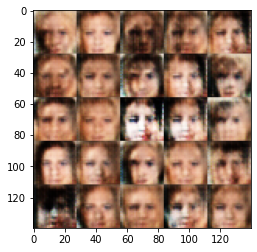

Epoch 1/3 Step 1110... Discriminator Loss: 1.2995... Generator Loss: 0.8317
Epoch 1/3 Step 1120... Discriminator Loss: 1.2281... Generator Loss: 0.9204
Epoch 1/3 Step 1130... Discriminator Loss: 1.2785... Generator Loss: 0.8378
Epoch 1/3 Step 1140... Discriminator Loss: 1.1685... Generator Loss: 0.9512
Epoch 1/3 Step 1150... Discriminator Loss: 1.2362... Generator Loss: 0.9630
Epoch 1/3 Step 1160... Discriminator Loss: 1.3036... Generator Loss: 0.8062
Epoch 1/3 Step 1170... Discriminator Loss: 1.3135... Generator Loss: 0.8404
Epoch 1/3 Step 1180... Discriminator Loss: 1.2810... Generator Loss: 0.9029
Epoch 1/3 Step 1190... Discriminator Loss: 1.3094... Generator Loss: 0.7906
Epoch 1/3 Step 1200... Discriminator Loss: 1.3159... Generator Loss: 0.9953


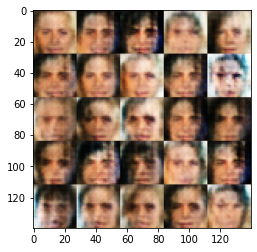

Epoch 1/3 Step 1210... Discriminator Loss: 1.2533... Generator Loss: 0.9011
Epoch 1/3 Step 1220... Discriminator Loss: 1.2749... Generator Loss: 0.9266
Epoch 1/3 Step 1230... Discriminator Loss: 1.2958... Generator Loss: 0.9357
Epoch 1/3 Step 1240... Discriminator Loss: 1.3306... Generator Loss: 0.8325
Epoch 1/3 Step 1250... Discriminator Loss: 1.2596... Generator Loss: 0.8097
Epoch 1/3 Step 1260... Discriminator Loss: 1.2682... Generator Loss: 0.8718
Epoch 1/3 Step 1270... Discriminator Loss: 1.2314... Generator Loss: 0.9332
Epoch 1/3 Step 1280... Discriminator Loss: 1.3294... Generator Loss: 0.7987
Epoch 1/3 Step 1290... Discriminator Loss: 1.2295... Generator Loss: 0.8227
Epoch 1/3 Step 1300... Discriminator Loss: 1.2733... Generator Loss: 1.0296


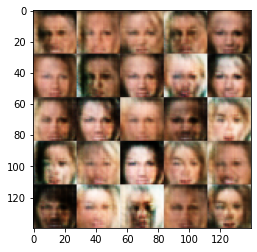

Epoch 1/3 Step 1310... Discriminator Loss: 1.2134... Generator Loss: 0.8925
Epoch 1/3 Step 1320... Discriminator Loss: 1.2670... Generator Loss: 0.9201
Epoch 1/3 Step 1330... Discriminator Loss: 1.2622... Generator Loss: 0.8240
Epoch 1/3 Step 1340... Discriminator Loss: 1.3628... Generator Loss: 0.8822
Epoch 1/3 Step 1350... Discriminator Loss: 1.3587... Generator Loss: 0.8657
Epoch 1/3 Step 1360... Discriminator Loss: 1.3291... Generator Loss: 0.8888
Epoch 1/3 Step 1370... Discriminator Loss: 1.3549... Generator Loss: 0.8180
Epoch 1/3 Step 1380... Discriminator Loss: 1.2883... Generator Loss: 0.8357
Epoch 1/3 Step 1390... Discriminator Loss: 1.2904... Generator Loss: 0.9349
Epoch 1/3 Step 1400... Discriminator Loss: 1.2305... Generator Loss: 0.9154


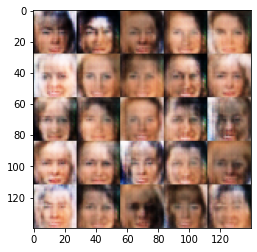

Epoch 1/3 Step 1410... Discriminator Loss: 1.4208... Generator Loss: 0.7300
Epoch 1/3 Step 1420... Discriminator Loss: 1.2627... Generator Loss: 0.9293
Epoch 1/3 Step 1430... Discriminator Loss: 1.2437... Generator Loss: 0.9596
Epoch 1/3 Step 1440... Discriminator Loss: 1.2104... Generator Loss: 0.8983
Epoch 1/3 Step 1450... Discriminator Loss: 1.3364... Generator Loss: 1.2749
Epoch 1/3 Step 1460... Discriminator Loss: 1.2554... Generator Loss: 0.8543
Epoch 1/3 Step 1470... Discriminator Loss: 1.2832... Generator Loss: 0.7637
Epoch 1/3 Step 1480... Discriminator Loss: 1.2913... Generator Loss: 0.9569
Epoch 1/3 Step 1490... Discriminator Loss: 1.2803... Generator Loss: 0.8841
Epoch 1/3 Step 1500... Discriminator Loss: 1.2556... Generator Loss: 0.9041


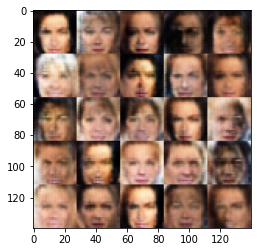

Epoch 1/3 Step 1510... Discriminator Loss: 1.3110... Generator Loss: 0.7464
Epoch 1/3 Step 1520... Discriminator Loss: 1.2675... Generator Loss: 0.7768
Epoch 1/3 Step 1530... Discriminator Loss: 1.2975... Generator Loss: 1.0156
Epoch 1/3 Step 1540... Discriminator Loss: 1.4131... Generator Loss: 0.7289
Epoch 1/3 Step 1550... Discriminator Loss: 1.3052... Generator Loss: 0.9479
Epoch 1/3 Step 1560... Discriminator Loss: 1.2159... Generator Loss: 0.8754
Epoch 1/3 Step 1570... Discriminator Loss: 1.2682... Generator Loss: 0.8764
Epoch 1/3 Step 1580... Discriminator Loss: 1.3595... Generator Loss: 0.9403
Epoch 1/3 Step 1590... Discriminator Loss: 1.3140... Generator Loss: 0.9099
Epoch 1/3 Step 1600... Discriminator Loss: 1.2522... Generator Loss: 0.8681


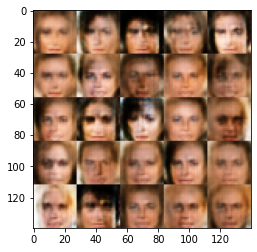

Epoch 1/3 Step 1610... Discriminator Loss: 1.3217... Generator Loss: 0.7430
Epoch 1/3 Step 1620... Discriminator Loss: 1.2786... Generator Loss: 0.8637
Epoch 1/3 Step 1630... Discriminator Loss: 1.2050... Generator Loss: 0.9108
Epoch 1/3 Step 1640... Discriminator Loss: 1.2839... Generator Loss: 0.8672
Epoch 1/3 Step 1650... Discriminator Loss: 1.3212... Generator Loss: 0.8041
Epoch 1/3 Step 1660... Discriminator Loss: 1.3243... Generator Loss: 0.9259
Epoch 1/3 Step 1670... Discriminator Loss: 1.2852... Generator Loss: 0.8287
Epoch 1/3 Step 1680... Discriminator Loss: 1.3484... Generator Loss: 1.1585
Epoch 1/3 Step 1690... Discriminator Loss: 1.3106... Generator Loss: 0.8551
Epoch 1/3 Step 1700... Discriminator Loss: 1.2433... Generator Loss: 0.8222


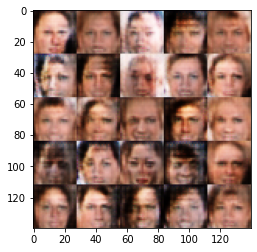

Epoch 1/3 Step 1710... Discriminator Loss: 1.2724... Generator Loss: 0.7111
Epoch 1/3 Step 1720... Discriminator Loss: 1.2045... Generator Loss: 0.9625
Epoch 1/3 Step 1730... Discriminator Loss: 1.3057... Generator Loss: 0.8368
Epoch 1/3 Step 1740... Discriminator Loss: 1.3214... Generator Loss: 0.8377
Epoch 1/3 Step 1750... Discriminator Loss: 1.2900... Generator Loss: 0.9395
Epoch 1/3 Step 1760... Discriminator Loss: 1.3039... Generator Loss: 0.9148
Epoch 1/3 Step 1770... Discriminator Loss: 1.3526... Generator Loss: 0.8225
Epoch 1/3 Step 1780... Discriminator Loss: 1.2222... Generator Loss: 0.9216
Epoch 1/3 Step 1790... Discriminator Loss: 1.3105... Generator Loss: 0.8150
Epoch 1/3 Step 1800... Discriminator Loss: 1.4131... Generator Loss: 0.7800


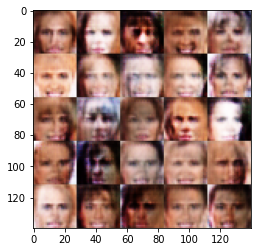

Epoch 1/3 Step 1810... Discriminator Loss: 1.1758... Generator Loss: 0.8630
Epoch 1/3 Step 1820... Discriminator Loss: 1.2218... Generator Loss: 0.8853
Epoch 1/3 Step 1830... Discriminator Loss: 1.2885... Generator Loss: 0.9525
Epoch 1/3 Step 1840... Discriminator Loss: 1.2753... Generator Loss: 0.9198
Epoch 1/3 Step 1850... Discriminator Loss: 1.2587... Generator Loss: 0.9173
Epoch 1/3 Step 1860... Discriminator Loss: 1.3170... Generator Loss: 0.8693
Epoch 1/3 Step 1870... Discriminator Loss: 1.3109... Generator Loss: 0.7818
Epoch 1/3 Step 1880... Discriminator Loss: 1.2539... Generator Loss: 0.8477
Epoch 1/3 Step 1890... Discriminator Loss: 1.3297... Generator Loss: 0.8913
Epoch 1/3 Step 1900... Discriminator Loss: 1.2871... Generator Loss: 0.8419


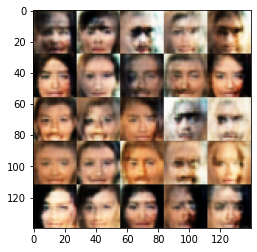

Epoch 1/3 Step 1910... Discriminator Loss: 1.3727... Generator Loss: 0.8889
Epoch 1/3 Step 1920... Discriminator Loss: 1.2036... Generator Loss: 0.8909
Epoch 1/3 Step 1930... Discriminator Loss: 1.2297... Generator Loss: 0.8863
Epoch 1/3 Step 1940... Discriminator Loss: 1.2765... Generator Loss: 0.8863
Epoch 1/3 Step 1950... Discriminator Loss: 1.2817... Generator Loss: 0.8293
Epoch 1/3 Step 1960... Discriminator Loss: 1.3184... Generator Loss: 0.9573
Epoch 1/3 Step 1970... Discriminator Loss: 1.3460... Generator Loss: 0.7987
Epoch 1/3 Step 1980... Discriminator Loss: 1.2562... Generator Loss: 0.8979
Epoch 1/3 Step 1990... Discriminator Loss: 1.2883... Generator Loss: 0.8426
Epoch 1/3 Step 2000... Discriminator Loss: 1.2743... Generator Loss: 0.9273


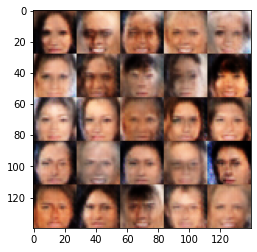

Epoch 1/3 Step 2010... Discriminator Loss: 1.3663... Generator Loss: 0.8147
Epoch 1/3 Step 2020... Discriminator Loss: 1.3209... Generator Loss: 0.8560
Epoch 1/3 Step 2030... Discriminator Loss: 1.2759... Generator Loss: 0.8427
Epoch 1/3 Step 2040... Discriminator Loss: 1.2729... Generator Loss: 0.8729
Epoch 1/3 Step 2050... Discriminator Loss: 1.2529... Generator Loss: 0.8884
Epoch 1/3 Step 2060... Discriminator Loss: 1.2633... Generator Loss: 0.9313
Epoch 1/3 Step 2070... Discriminator Loss: 1.2507... Generator Loss: 0.8553
Epoch 1/3 Step 2080... Discriminator Loss: 1.3017... Generator Loss: 0.8023
Epoch 1/3 Step 2090... Discriminator Loss: 1.2284... Generator Loss: 0.7425
Epoch 1/3 Step 2100... Discriminator Loss: 1.2507... Generator Loss: 0.8309


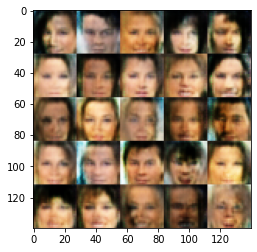

Epoch 1/3 Step 2110... Discriminator Loss: 1.2858... Generator Loss: 0.9169
Epoch 1/3 Step 2120... Discriminator Loss: 1.2906... Generator Loss: 0.9950
Epoch 1/3 Step 2130... Discriminator Loss: 1.3379... Generator Loss: 0.8756
Epoch 1/3 Step 2140... Discriminator Loss: 1.3429... Generator Loss: 1.0691
Epoch 1/3 Step 2150... Discriminator Loss: 1.3324... Generator Loss: 0.7694
Epoch 1/3 Step 2160... Discriminator Loss: 1.2904... Generator Loss: 0.8155
Epoch 1/3 Step 2170... Discriminator Loss: 1.2255... Generator Loss: 0.8700
Epoch 1/3 Step 2180... Discriminator Loss: 1.2964... Generator Loss: 0.8897
Epoch 1/3 Step 2190... Discriminator Loss: 1.3120... Generator Loss: 0.8225
Epoch 1/3 Step 2200... Discriminator Loss: 1.2625... Generator Loss: 0.9000


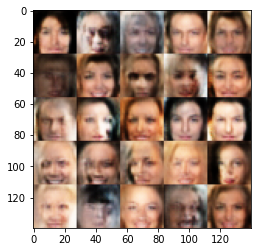

Epoch 1/3 Step 2210... Discriminator Loss: 1.2808... Generator Loss: 0.9538
Epoch 1/3 Step 2220... Discriminator Loss: 1.3107... Generator Loss: 0.8508
Epoch 1/3 Step 2230... Discriminator Loss: 1.2424... Generator Loss: 1.0027
Epoch 1/3 Step 2240... Discriminator Loss: 1.5396... Generator Loss: 0.5979
Epoch 1/3 Step 2250... Discriminator Loss: 1.3038... Generator Loss: 0.9831
Epoch 1/3 Step 2260... Discriminator Loss: 1.3492... Generator Loss: 0.8468
Epoch 1/3 Step 2270... Discriminator Loss: 1.2713... Generator Loss: 0.8510
Epoch 1/3 Step 2280... Discriminator Loss: 1.2142... Generator Loss: 0.8053
Epoch 1/3 Step 2290... Discriminator Loss: 1.3220... Generator Loss: 0.8862
Epoch 1/3 Step 2300... Discriminator Loss: 1.2651... Generator Loss: 0.8690


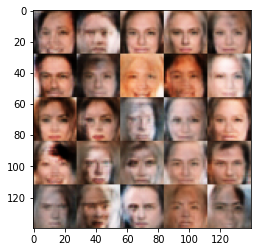

Epoch 1/3 Step 2310... Discriminator Loss: 1.2702... Generator Loss: 0.9237
Epoch 1/3 Step 2320... Discriminator Loss: 1.2772... Generator Loss: 0.9475
Epoch 1/3 Step 2330... Discriminator Loss: 1.1998... Generator Loss: 0.9425
Epoch 1/3 Step 2340... Discriminator Loss: 1.2846... Generator Loss: 0.9145
Epoch 1/3 Step 2350... Discriminator Loss: 1.2568... Generator Loss: 0.8165
Epoch 1/3 Step 2360... Discriminator Loss: 1.2350... Generator Loss: 0.8942
Epoch 1/3 Step 2370... Discriminator Loss: 1.2926... Generator Loss: 0.8220
Epoch 1/3 Step 2380... Discriminator Loss: 1.2724... Generator Loss: 0.8976
Epoch 1/3 Step 2390... Discriminator Loss: 1.3650... Generator Loss: 0.8449
Epoch 1/3 Step 2400... Discriminator Loss: 1.3662... Generator Loss: 0.6758


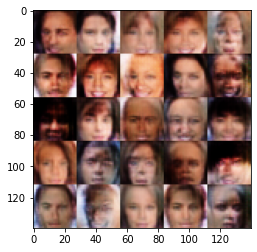

Epoch 1/3 Step 2410... Discriminator Loss: 1.2705... Generator Loss: 0.7549
Epoch 1/3 Step 2420... Discriminator Loss: 1.3248... Generator Loss: 0.8449
Epoch 1/3 Step 2430... Discriminator Loss: 1.2696... Generator Loss: 0.8847
Epoch 1/3 Step 2440... Discriminator Loss: 1.3186... Generator Loss: 0.8157
Epoch 1/3 Step 2450... Discriminator Loss: 1.2676... Generator Loss: 0.7443
Epoch 1/3 Step 2460... Discriminator Loss: 1.2933... Generator Loss: 0.8521
Epoch 1/3 Step 2470... Discriminator Loss: 1.3093... Generator Loss: 0.7727
Epoch 1/3 Step 2480... Discriminator Loss: 1.2862... Generator Loss: 0.8386
Epoch 1/3 Step 2490... Discriminator Loss: 1.3741... Generator Loss: 0.7589
Epoch 1/3 Step 2500... Discriminator Loss: 1.3181... Generator Loss: 1.0498


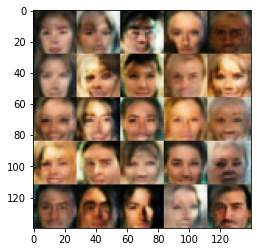

Epoch 1/3 Step 2510... Discriminator Loss: 1.3007... Generator Loss: 0.9010
Epoch 1/3 Step 2520... Discriminator Loss: 1.2871... Generator Loss: 1.0062
Epoch 1/3 Step 2530... Discriminator Loss: 1.2861... Generator Loss: 0.9212
Epoch 1/3 Step 2540... Discriminator Loss: 1.3013... Generator Loss: 0.7810
Epoch 1/3 Step 2550... Discriminator Loss: 1.2303... Generator Loss: 0.9111
Epoch 1/3 Step 2560... Discriminator Loss: 1.2587... Generator Loss: 0.9960
Epoch 1/3 Step 2570... Discriminator Loss: 1.2682... Generator Loss: 0.8762
Epoch 1/3 Step 2580... Discriminator Loss: 1.3313... Generator Loss: 1.0025
Epoch 1/3 Step 2590... Discriminator Loss: 1.2487... Generator Loss: 0.8638
Epoch 1/3 Step 2600... Discriminator Loss: 1.2995... Generator Loss: 0.8075


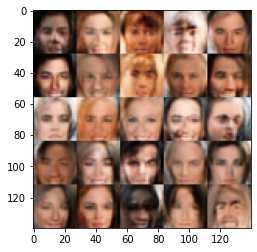

Epoch 1/3 Step 2610... Discriminator Loss: 1.3169... Generator Loss: 0.8473
Epoch 1/3 Step 2620... Discriminator Loss: 1.3308... Generator Loss: 0.8669
Epoch 1/3 Step 2630... Discriminator Loss: 1.2369... Generator Loss: 0.8675
Epoch 1/3 Step 2640... Discriminator Loss: 1.3476... Generator Loss: 0.7559
Epoch 1/3 Step 2650... Discriminator Loss: 1.2941... Generator Loss: 0.8353
Epoch 1/3 Step 2660... Discriminator Loss: 1.3013... Generator Loss: 0.8453
Epoch 1/3 Step 2670... Discriminator Loss: 1.3108... Generator Loss: 0.8102
Epoch 1/3 Step 2680... Discriminator Loss: 1.3426... Generator Loss: 0.7537
Epoch 1/3 Step 2690... Discriminator Loss: 1.2629... Generator Loss: 0.9638
Epoch 1/3 Step 2700... Discriminator Loss: 1.2495... Generator Loss: 0.9146


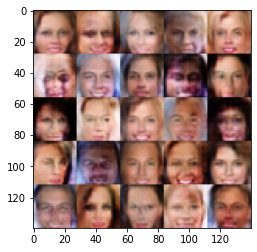

Epoch 1/3 Step 2710... Discriminator Loss: 1.3466... Generator Loss: 1.0133
Epoch 1/3 Step 2720... Discriminator Loss: 1.2158... Generator Loss: 1.0202
Epoch 1/3 Step 2730... Discriminator Loss: 1.2599... Generator Loss: 0.9410
Epoch 1/3 Step 2740... Discriminator Loss: 1.1726... Generator Loss: 0.9621
Epoch 1/3 Step 2750... Discriminator Loss: 1.2720... Generator Loss: 0.9212
Epoch 1/3 Step 2760... Discriminator Loss: 1.2543... Generator Loss: 1.1526
Epoch 1/3 Step 2770... Discriminator Loss: 1.2685... Generator Loss: 0.8152
Epoch 1/3 Step 2780... Discriminator Loss: 1.2697... Generator Loss: 0.8295
Epoch 1/3 Step 2790... Discriminator Loss: 1.2412... Generator Loss: 0.9973
Epoch 1/3 Step 2800... Discriminator Loss: 1.2436... Generator Loss: 1.0304


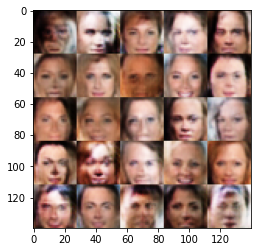

Epoch 1/3 Step 2810... Discriminator Loss: 1.2772... Generator Loss: 0.8988
Epoch 1/3 Step 2820... Discriminator Loss: 1.2475... Generator Loss: 0.9069
Epoch 1/3 Step 2830... Discriminator Loss: 1.2344... Generator Loss: 1.0555
Epoch 1/3 Step 2840... Discriminator Loss: 1.1924... Generator Loss: 0.9572
Epoch 1/3 Step 2850... Discriminator Loss: 1.2135... Generator Loss: 0.9714
Epoch 1/3 Step 2860... Discriminator Loss: 1.3193... Generator Loss: 0.8004
Epoch 1/3 Step 2870... Discriminator Loss: 1.2043... Generator Loss: 0.8732
Epoch 1/3 Step 2880... Discriminator Loss: 1.2758... Generator Loss: 0.8204
Epoch 1/3 Step 2890... Discriminator Loss: 1.2566... Generator Loss: 0.8426
Epoch 1/3 Step 2900... Discriminator Loss: 1.2260... Generator Loss: 0.9276


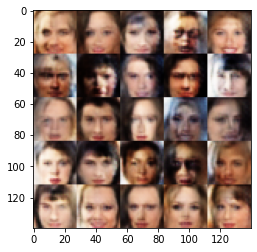

Epoch 1/3 Step 2910... Discriminator Loss: 1.2622... Generator Loss: 0.9146
Epoch 1/3 Step 2920... Discriminator Loss: 1.2342... Generator Loss: 1.0035
Epoch 1/3 Step 2930... Discriminator Loss: 1.2319... Generator Loss: 0.8807
Epoch 1/3 Step 2940... Discriminator Loss: 1.2051... Generator Loss: 0.8159
Epoch 1/3 Step 2950... Discriminator Loss: 1.2837... Generator Loss: 0.8589
Epoch 1/3 Step 2960... Discriminator Loss: 1.2298... Generator Loss: 0.9223
Epoch 1/3 Step 2970... Discriminator Loss: 1.4225... Generator Loss: 1.4169
Epoch 1/3 Step 2980... Discriminator Loss: 1.2421... Generator Loss: 0.8537
Epoch 1/3 Step 2990... Discriminator Loss: 1.2672... Generator Loss: 0.8866
Epoch 1/3 Step 3000... Discriminator Loss: 1.3426... Generator Loss: 0.8824


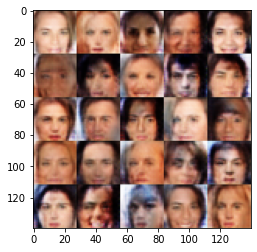

Epoch 1/3 Step 3010... Discriminator Loss: 1.2547... Generator Loss: 0.9302
Epoch 1/3 Step 3020... Discriminator Loss: 1.1930... Generator Loss: 0.9985
Epoch 1/3 Step 3030... Discriminator Loss: 1.2213... Generator Loss: 0.9491
Epoch 1/3 Step 3040... Discriminator Loss: 1.2803... Generator Loss: 0.7150
Epoch 1/3 Step 3050... Discriminator Loss: 1.2738... Generator Loss: 1.0459
Epoch 1/3 Step 3060... Discriminator Loss: 1.3281... Generator Loss: 0.9098
Epoch 1/3 Step 3070... Discriminator Loss: 1.2837... Generator Loss: 0.8627
Epoch 1/3 Step 3080... Discriminator Loss: 1.2802... Generator Loss: 0.9240
Epoch 1/3 Step 3090... Discriminator Loss: 1.2509... Generator Loss: 0.9915
Epoch 1/3 Step 3100... Discriminator Loss: 1.1970... Generator Loss: 1.0244


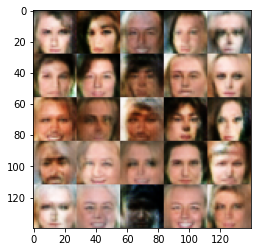

Epoch 1/3 Step 3110... Discriminator Loss: 1.2797... Generator Loss: 1.1659
Epoch 1/3 Step 3120... Discriminator Loss: 1.1461... Generator Loss: 0.8679
Epoch 1/3 Step 3130... Discriminator Loss: 1.2031... Generator Loss: 0.9289
Epoch 1/3 Step 3140... Discriminator Loss: 1.1910... Generator Loss: 0.9911
Epoch 1/3 Step 3150... Discriminator Loss: 1.2562... Generator Loss: 0.9995
Epoch 1/3 Step 3160... Discriminator Loss: 1.2503... Generator Loss: 0.9001
Epoch 2/3 Step 3170... Discriminator Loss: 1.2604... Generator Loss: 0.9423
Epoch 2/3 Step 3180... Discriminator Loss: 1.2439... Generator Loss: 0.7808
Epoch 2/3 Step 3190... Discriminator Loss: 1.1477... Generator Loss: 1.0159
Epoch 2/3 Step 3200... Discriminator Loss: 1.2476... Generator Loss: 1.0173


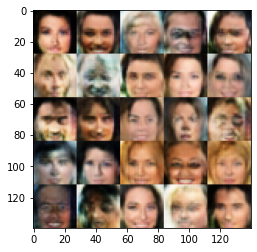

Epoch 2/3 Step 3210... Discriminator Loss: 1.2294... Generator Loss: 0.9896
Epoch 2/3 Step 3220... Discriminator Loss: 1.2297... Generator Loss: 0.8801
Epoch 2/3 Step 3230... Discriminator Loss: 1.1879... Generator Loss: 0.9933
Epoch 2/3 Step 3240... Discriminator Loss: 1.1509... Generator Loss: 0.9636
Epoch 2/3 Step 3250... Discriminator Loss: 1.1987... Generator Loss: 1.0628
Epoch 2/3 Step 3260... Discriminator Loss: 1.2540... Generator Loss: 0.9683
Epoch 2/3 Step 3270... Discriminator Loss: 1.3177... Generator Loss: 0.7830
Epoch 2/3 Step 3280... Discriminator Loss: 1.2075... Generator Loss: 1.0172
Epoch 2/3 Step 3290... Discriminator Loss: 1.2968... Generator Loss: 1.0739
Epoch 2/3 Step 3300... Discriminator Loss: 1.2733... Generator Loss: 0.7952


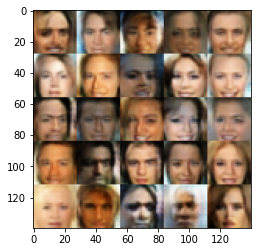

Epoch 2/3 Step 3310... Discriminator Loss: 1.2168... Generator Loss: 0.9460
Epoch 2/3 Step 3320... Discriminator Loss: 1.2452... Generator Loss: 1.0968
Epoch 2/3 Step 3330... Discriminator Loss: 1.2074... Generator Loss: 0.9668
Epoch 2/3 Step 3340... Discriminator Loss: 1.3020... Generator Loss: 0.8945
Epoch 2/3 Step 3350... Discriminator Loss: 1.2175... Generator Loss: 1.0290
Epoch 2/3 Step 3360... Discriminator Loss: 1.2994... Generator Loss: 0.8817
Epoch 2/3 Step 3370... Discriminator Loss: 1.2312... Generator Loss: 0.9407
Epoch 2/3 Step 3380... Discriminator Loss: 1.2170... Generator Loss: 0.9245
Epoch 2/3 Step 3390... Discriminator Loss: 1.1916... Generator Loss: 1.0899
Epoch 2/3 Step 3400... Discriminator Loss: 1.2114... Generator Loss: 1.1461


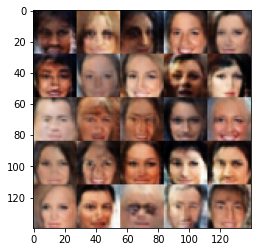

Epoch 2/3 Step 3410... Discriminator Loss: 1.2434... Generator Loss: 0.8818
Epoch 2/3 Step 3420... Discriminator Loss: 1.1982... Generator Loss: 0.9722
Epoch 2/3 Step 3430... Discriminator Loss: 1.1756... Generator Loss: 1.2611
Epoch 2/3 Step 3440... Discriminator Loss: 1.2244... Generator Loss: 0.9290
Epoch 2/3 Step 3450... Discriminator Loss: 1.1658... Generator Loss: 1.0836
Epoch 2/3 Step 3460... Discriminator Loss: 1.1602... Generator Loss: 1.0344
Epoch 2/3 Step 3470... Discriminator Loss: 1.2023... Generator Loss: 0.9126
Epoch 2/3 Step 3480... Discriminator Loss: 1.2300... Generator Loss: 0.9065
Epoch 2/3 Step 3490... Discriminator Loss: 1.2969... Generator Loss: 0.8743
Epoch 2/3 Step 3500... Discriminator Loss: 1.1984... Generator Loss: 1.0062


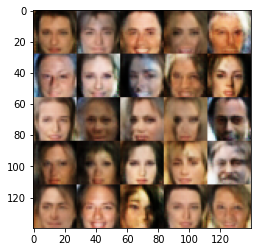

Epoch 2/3 Step 3510... Discriminator Loss: 1.2285... Generator Loss: 0.8920
Epoch 2/3 Step 3520... Discriminator Loss: 1.1750... Generator Loss: 1.0254
Epoch 2/3 Step 3530... Discriminator Loss: 1.2470... Generator Loss: 0.9066
Epoch 2/3 Step 3540... Discriminator Loss: 1.2366... Generator Loss: 1.0215
Epoch 2/3 Step 3550... Discriminator Loss: 1.2198... Generator Loss: 0.9315
Epoch 2/3 Step 3560... Discriminator Loss: 1.2724... Generator Loss: 0.6387
Epoch 2/3 Step 3570... Discriminator Loss: 1.2439... Generator Loss: 0.8413
Epoch 2/3 Step 3580... Discriminator Loss: 1.2178... Generator Loss: 1.1126
Epoch 2/3 Step 3590... Discriminator Loss: 1.2113... Generator Loss: 0.9760
Epoch 2/3 Step 3600... Discriminator Loss: 1.1833... Generator Loss: 1.2209


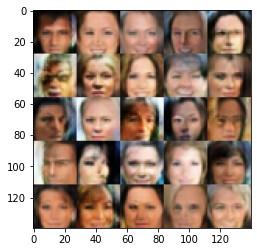

Epoch 2/3 Step 3610... Discriminator Loss: 1.2417... Generator Loss: 1.2548
Epoch 2/3 Step 3620... Discriminator Loss: 1.2411... Generator Loss: 1.0192
Epoch 2/3 Step 3630... Discriminator Loss: 1.2703... Generator Loss: 1.2274
Epoch 2/3 Step 3640... Discriminator Loss: 1.2275... Generator Loss: 0.9987
Epoch 2/3 Step 3650... Discriminator Loss: 1.2391... Generator Loss: 1.0946
Epoch 2/3 Step 3660... Discriminator Loss: 1.1561... Generator Loss: 1.0866
Epoch 2/3 Step 3670... Discriminator Loss: 1.2591... Generator Loss: 0.7994
Epoch 2/3 Step 3680... Discriminator Loss: 1.1667... Generator Loss: 0.9470
Epoch 2/3 Step 3690... Discriminator Loss: 1.1612... Generator Loss: 0.9395
Epoch 2/3 Step 3700... Discriminator Loss: 1.1726... Generator Loss: 1.1010


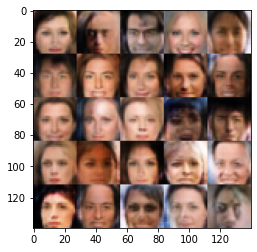

Epoch 2/3 Step 3710... Discriminator Loss: 1.1670... Generator Loss: 1.0142
Epoch 2/3 Step 3720... Discriminator Loss: 1.1510... Generator Loss: 1.1581
Epoch 2/3 Step 3730... Discriminator Loss: 1.3879... Generator Loss: 1.0614
Epoch 2/3 Step 3740... Discriminator Loss: 1.1787... Generator Loss: 1.1296
Epoch 2/3 Step 3750... Discriminator Loss: 1.1297... Generator Loss: 1.0250
Epoch 2/3 Step 3760... Discriminator Loss: 1.1420... Generator Loss: 1.0076
Epoch 2/3 Step 3770... Discriminator Loss: 1.2328... Generator Loss: 1.0114
Epoch 2/3 Step 3780... Discriminator Loss: 1.2309... Generator Loss: 0.8944
Epoch 2/3 Step 3790... Discriminator Loss: 1.2677... Generator Loss: 0.8385
Epoch 2/3 Step 3800... Discriminator Loss: 1.2352... Generator Loss: 0.9237


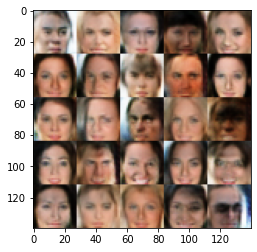

Epoch 2/3 Step 3810... Discriminator Loss: 1.1111... Generator Loss: 1.0670
Epoch 2/3 Step 3820... Discriminator Loss: 1.1717... Generator Loss: 0.9696
Epoch 2/3 Step 3830... Discriminator Loss: 1.1909... Generator Loss: 0.9726
Epoch 2/3 Step 3840... Discriminator Loss: 1.1949... Generator Loss: 0.9879
Epoch 2/3 Step 3850... Discriminator Loss: 1.1545... Generator Loss: 0.8957
Epoch 2/3 Step 3860... Discriminator Loss: 1.2464... Generator Loss: 0.7589
Epoch 2/3 Step 3870... Discriminator Loss: 1.2383... Generator Loss: 1.1249
Epoch 2/3 Step 3880... Discriminator Loss: 1.2203... Generator Loss: 0.9900
Epoch 2/3 Step 3890... Discriminator Loss: 1.1536... Generator Loss: 1.0697
Epoch 2/3 Step 3900... Discriminator Loss: 1.1847... Generator Loss: 0.9096


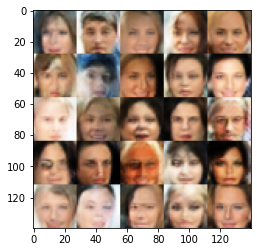

Epoch 2/3 Step 3910... Discriminator Loss: 1.1951... Generator Loss: 0.8217
Epoch 2/3 Step 3920... Discriminator Loss: 1.1846... Generator Loss: 1.0074
Epoch 2/3 Step 3930... Discriminator Loss: 1.1415... Generator Loss: 1.1160
Epoch 2/3 Step 3940... Discriminator Loss: 1.1856... Generator Loss: 0.9262
Epoch 2/3 Step 3950... Discriminator Loss: 1.2285... Generator Loss: 0.7808
Epoch 2/3 Step 3960... Discriminator Loss: 1.1305... Generator Loss: 0.9843
Epoch 2/3 Step 3970... Discriminator Loss: 1.2254... Generator Loss: 0.8949
Epoch 2/3 Step 3980... Discriminator Loss: 1.2688... Generator Loss: 1.1054
Epoch 2/3 Step 3990... Discriminator Loss: 1.1558... Generator Loss: 0.9555
Epoch 2/3 Step 4000... Discriminator Loss: 1.2610... Generator Loss: 0.8415


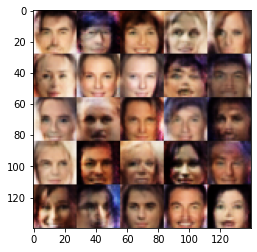

Epoch 2/3 Step 4010... Discriminator Loss: 1.1521... Generator Loss: 0.9126
Epoch 2/3 Step 4020... Discriminator Loss: 1.1066... Generator Loss: 1.0515
Epoch 2/3 Step 4030... Discriminator Loss: 1.1026... Generator Loss: 1.1629
Epoch 2/3 Step 4040... Discriminator Loss: 1.2030... Generator Loss: 0.9056
Epoch 2/3 Step 4050... Discriminator Loss: 1.2767... Generator Loss: 1.2072
Epoch 2/3 Step 4060... Discriminator Loss: 1.1921... Generator Loss: 1.0053
Epoch 2/3 Step 4070... Discriminator Loss: 1.2105... Generator Loss: 1.0575
Epoch 2/3 Step 4080... Discriminator Loss: 1.2272... Generator Loss: 1.1145
Epoch 2/3 Step 4090... Discriminator Loss: 1.2296... Generator Loss: 0.9642
Epoch 2/3 Step 4100... Discriminator Loss: 1.2543... Generator Loss: 0.8143


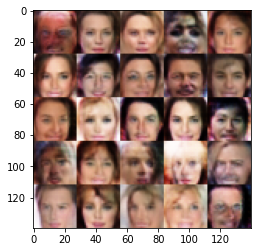

Epoch 2/3 Step 4110... Discriminator Loss: 1.2367... Generator Loss: 0.7976
Epoch 2/3 Step 4120... Discriminator Loss: 1.0881... Generator Loss: 1.0986
Epoch 2/3 Step 4130... Discriminator Loss: 1.1590... Generator Loss: 1.2501
Epoch 2/3 Step 4140... Discriminator Loss: 1.1368... Generator Loss: 0.9087
Epoch 2/3 Step 4150... Discriminator Loss: 1.1134... Generator Loss: 0.8684
Epoch 2/3 Step 4160... Discriminator Loss: 1.1070... Generator Loss: 1.2523
Epoch 2/3 Step 4170... Discriminator Loss: 1.2194... Generator Loss: 0.8003
Epoch 2/3 Step 4180... Discriminator Loss: 1.0915... Generator Loss: 1.1355
Epoch 2/3 Step 4190... Discriminator Loss: 1.1068... Generator Loss: 0.9726
Epoch 2/3 Step 4200... Discriminator Loss: 1.1719... Generator Loss: 1.0139


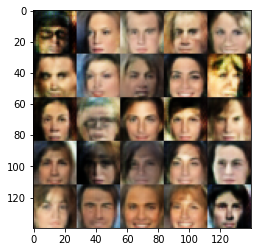

Epoch 2/3 Step 4210... Discriminator Loss: 1.0831... Generator Loss: 1.2666
Epoch 2/3 Step 4220... Discriminator Loss: 1.0618... Generator Loss: 1.0984
Epoch 2/3 Step 4230... Discriminator Loss: 1.2142... Generator Loss: 0.8870
Epoch 2/3 Step 4240... Discriminator Loss: 1.2172... Generator Loss: 0.8724
Epoch 2/3 Step 4250... Discriminator Loss: 1.1405... Generator Loss: 1.0657
Epoch 2/3 Step 4260... Discriminator Loss: 1.1886... Generator Loss: 1.0991
Epoch 2/3 Step 4270... Discriminator Loss: 1.2050... Generator Loss: 1.1713
Epoch 2/3 Step 4280... Discriminator Loss: 1.2342... Generator Loss: 0.7915
Epoch 2/3 Step 4290... Discriminator Loss: 1.1640... Generator Loss: 0.9055
Epoch 2/3 Step 4300... Discriminator Loss: 1.1346... Generator Loss: 1.1047


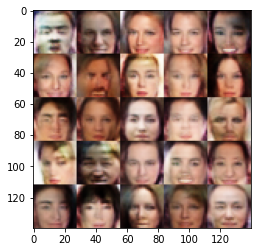

Epoch 2/3 Step 4310... Discriminator Loss: 1.1481... Generator Loss: 0.9968
Epoch 2/3 Step 4320... Discriminator Loss: 1.1390... Generator Loss: 1.0318
Epoch 2/3 Step 4330... Discriminator Loss: 1.0570... Generator Loss: 1.0552
Epoch 2/3 Step 4340... Discriminator Loss: 1.1823... Generator Loss: 0.7860
Epoch 2/3 Step 4350... Discriminator Loss: 1.2243... Generator Loss: 0.9269
Epoch 2/3 Step 4360... Discriminator Loss: 1.2075... Generator Loss: 1.1017
Epoch 2/3 Step 4370... Discriminator Loss: 1.2236... Generator Loss: 0.9761
Epoch 2/3 Step 4380... Discriminator Loss: 1.2161... Generator Loss: 0.7291
Epoch 2/3 Step 4390... Discriminator Loss: 1.1455... Generator Loss: 1.0128
Epoch 2/3 Step 4400... Discriminator Loss: 1.2182... Generator Loss: 0.9872


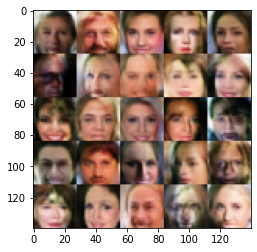

Epoch 2/3 Step 4410... Discriminator Loss: 1.2250... Generator Loss: 1.0538
Epoch 2/3 Step 4420... Discriminator Loss: 1.1378... Generator Loss: 1.0156
Epoch 2/3 Step 4430... Discriminator Loss: 1.1574... Generator Loss: 0.9812
Epoch 2/3 Step 4440... Discriminator Loss: 1.1436... Generator Loss: 0.9900
Epoch 2/3 Step 4450... Discriminator Loss: 1.1782... Generator Loss: 1.0558
Epoch 2/3 Step 4460... Discriminator Loss: 1.1511... Generator Loss: 1.1129
Epoch 2/3 Step 4470... Discriminator Loss: 1.1596... Generator Loss: 1.0235
Epoch 2/3 Step 4480... Discriminator Loss: 1.2326... Generator Loss: 0.8658
Epoch 2/3 Step 4490... Discriminator Loss: 1.1629... Generator Loss: 1.1530
Epoch 2/3 Step 4500... Discriminator Loss: 1.1283... Generator Loss: 1.1005


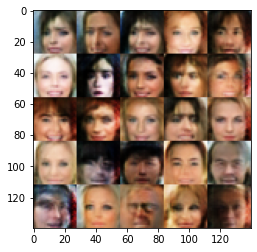

Epoch 2/3 Step 4510... Discriminator Loss: 1.2330... Generator Loss: 0.9226
Epoch 2/3 Step 4520... Discriminator Loss: 1.1377... Generator Loss: 1.2194
Epoch 2/3 Step 4530... Discriminator Loss: 1.1536... Generator Loss: 1.0741
Epoch 2/3 Step 4540... Discriminator Loss: 1.1374... Generator Loss: 1.2668
Epoch 2/3 Step 4550... Discriminator Loss: 1.2714... Generator Loss: 1.6261
Epoch 2/3 Step 4560... Discriminator Loss: 1.1497... Generator Loss: 1.0353
Epoch 2/3 Step 4570... Discriminator Loss: 1.1541... Generator Loss: 0.9217
Epoch 2/3 Step 4580... Discriminator Loss: 1.0945... Generator Loss: 1.1597
Epoch 2/3 Step 4590... Discriminator Loss: 1.1354... Generator Loss: 1.2410
Epoch 2/3 Step 4600... Discriminator Loss: 1.0588... Generator Loss: 1.0668


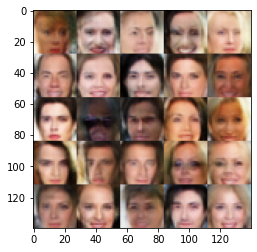

Epoch 2/3 Step 4610... Discriminator Loss: 1.1535... Generator Loss: 0.8164
Epoch 2/3 Step 4620... Discriminator Loss: 1.0625... Generator Loss: 1.1652
Epoch 2/3 Step 4630... Discriminator Loss: 1.2060... Generator Loss: 1.0958
Epoch 2/3 Step 4640... Discriminator Loss: 1.1357... Generator Loss: 0.9656
Epoch 2/3 Step 4650... Discriminator Loss: 1.2150... Generator Loss: 0.9621
Epoch 2/3 Step 4660... Discriminator Loss: 1.1890... Generator Loss: 1.1466
Epoch 2/3 Step 4670... Discriminator Loss: 1.1150... Generator Loss: 1.0025
Epoch 2/3 Step 4680... Discriminator Loss: 1.1604... Generator Loss: 0.9843
Epoch 2/3 Step 4690... Discriminator Loss: 1.1703... Generator Loss: 1.0591
Epoch 2/3 Step 4700... Discriminator Loss: 1.1838... Generator Loss: 1.2595


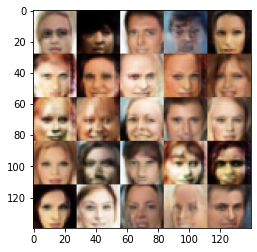

Epoch 2/3 Step 4710... Discriminator Loss: 1.0916... Generator Loss: 1.1442
Epoch 2/3 Step 4720... Discriminator Loss: 1.1654... Generator Loss: 1.0702
Epoch 2/3 Step 4730... Discriminator Loss: 1.2050... Generator Loss: 0.8974
Epoch 2/3 Step 4740... Discriminator Loss: 1.1682... Generator Loss: 0.9321
Epoch 2/3 Step 4750... Discriminator Loss: 1.0806... Generator Loss: 1.1765
Epoch 2/3 Step 4760... Discriminator Loss: 1.1033... Generator Loss: 1.1512
Epoch 2/3 Step 4770... Discriminator Loss: 1.1181... Generator Loss: 1.1396
Epoch 2/3 Step 4780... Discriminator Loss: 1.2536... Generator Loss: 0.7857
Epoch 2/3 Step 4790... Discriminator Loss: 1.0597... Generator Loss: 1.0232
Epoch 2/3 Step 4800... Discriminator Loss: 1.5298... Generator Loss: 1.9743


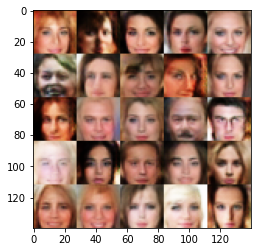

Epoch 2/3 Step 4810... Discriminator Loss: 1.1857... Generator Loss: 0.8945
Epoch 2/3 Step 4820... Discriminator Loss: 1.0990... Generator Loss: 0.9909
Epoch 2/3 Step 4830... Discriminator Loss: 1.1023... Generator Loss: 1.0695
Epoch 2/3 Step 4840... Discriminator Loss: 1.2697... Generator Loss: 0.8004
Epoch 2/3 Step 4850... Discriminator Loss: 1.1212... Generator Loss: 1.1269
Epoch 2/3 Step 4860... Discriminator Loss: 1.0090... Generator Loss: 1.2997
Epoch 2/3 Step 4870... Discriminator Loss: 1.0830... Generator Loss: 0.9478
Epoch 2/3 Step 4880... Discriminator Loss: 1.1165... Generator Loss: 1.0843
Epoch 2/3 Step 4890... Discriminator Loss: 1.1310... Generator Loss: 1.0133
Epoch 2/3 Step 4900... Discriminator Loss: 1.0142... Generator Loss: 1.4087


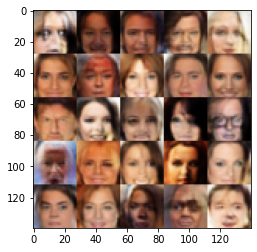

Epoch 2/3 Step 4910... Discriminator Loss: 1.2123... Generator Loss: 0.9336
Epoch 2/3 Step 4920... Discriminator Loss: 1.0045... Generator Loss: 1.3104
Epoch 2/3 Step 4930... Discriminator Loss: 1.1031... Generator Loss: 1.0420
Epoch 2/3 Step 4940... Discriminator Loss: 1.2119... Generator Loss: 0.8372
Epoch 2/3 Step 4950... Discriminator Loss: 1.1103... Generator Loss: 1.1893
Epoch 2/3 Step 4960... Discriminator Loss: 1.1195... Generator Loss: 1.0815
Epoch 2/3 Step 4970... Discriminator Loss: 1.1117... Generator Loss: 1.3326
Epoch 2/3 Step 4980... Discriminator Loss: 1.1993... Generator Loss: 1.5619
Epoch 2/3 Step 4990... Discriminator Loss: 1.2002... Generator Loss: 0.8972
Epoch 2/3 Step 5000... Discriminator Loss: 1.1243... Generator Loss: 1.0211


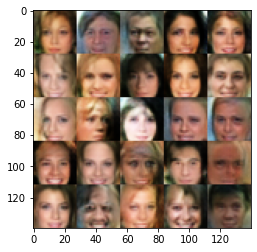

Epoch 2/3 Step 5010... Discriminator Loss: 1.1280... Generator Loss: 1.1537
Epoch 2/3 Step 5020... Discriminator Loss: 1.1380... Generator Loss: 0.9761
Epoch 2/3 Step 5030... Discriminator Loss: 1.2437... Generator Loss: 0.7795
Epoch 2/3 Step 5040... Discriminator Loss: 1.1109... Generator Loss: 0.9563
Epoch 2/3 Step 5050... Discriminator Loss: 1.0930... Generator Loss: 1.0798
Epoch 2/3 Step 5060... Discriminator Loss: 1.1387... Generator Loss: 1.4214
Epoch 2/3 Step 5070... Discriminator Loss: 1.0302... Generator Loss: 1.3696
Epoch 2/3 Step 5080... Discriminator Loss: 1.1112... Generator Loss: 1.0319
Epoch 2/3 Step 5090... Discriminator Loss: 1.0605... Generator Loss: 1.0766
Epoch 2/3 Step 5100... Discriminator Loss: 1.0747... Generator Loss: 1.2300


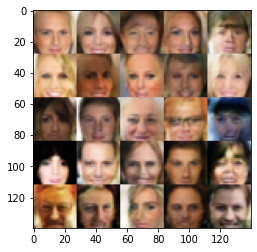

Epoch 2/3 Step 5110... Discriminator Loss: 1.0073... Generator Loss: 1.2972
Epoch 2/3 Step 5120... Discriminator Loss: 1.0384... Generator Loss: 1.0325
Epoch 2/3 Step 5130... Discriminator Loss: 1.1319... Generator Loss: 1.0060
Epoch 2/3 Step 5140... Discriminator Loss: 1.0871... Generator Loss: 1.2853
Epoch 2/3 Step 5150... Discriminator Loss: 1.1286... Generator Loss: 1.1111
Epoch 2/3 Step 5160... Discriminator Loss: 1.1131... Generator Loss: 0.9375
Epoch 2/3 Step 5170... Discriminator Loss: 1.1317... Generator Loss: 0.8729
Epoch 2/3 Step 5180... Discriminator Loss: 1.1512... Generator Loss: 1.2266
Epoch 2/3 Step 5190... Discriminator Loss: 1.1380... Generator Loss: 1.4476
Epoch 2/3 Step 5200... Discriminator Loss: 1.1573... Generator Loss: 1.1506


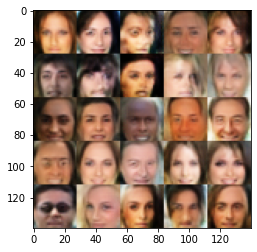

Epoch 2/3 Step 5210... Discriminator Loss: 1.1406... Generator Loss: 0.9224
Epoch 2/3 Step 5220... Discriminator Loss: 1.1235... Generator Loss: 1.1666
Epoch 2/3 Step 5230... Discriminator Loss: 1.1814... Generator Loss: 1.1288
Epoch 2/3 Step 5240... Discriminator Loss: 1.0906... Generator Loss: 1.0317
Epoch 2/3 Step 5250... Discriminator Loss: 1.2891... Generator Loss: 0.7311
Epoch 2/3 Step 5260... Discriminator Loss: 1.0700... Generator Loss: 1.0853
Epoch 2/3 Step 5270... Discriminator Loss: 1.0789... Generator Loss: 1.2321
Epoch 2/3 Step 5280... Discriminator Loss: 1.1061... Generator Loss: 1.0630
Epoch 2/3 Step 5290... Discriminator Loss: 1.1050... Generator Loss: 1.1938
Epoch 2/3 Step 5300... Discriminator Loss: 1.1753... Generator Loss: 0.8101


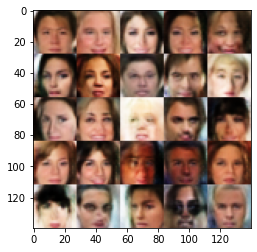

Epoch 2/3 Step 5310... Discriminator Loss: 1.0435... Generator Loss: 1.0349
Epoch 2/3 Step 5320... Discriminator Loss: 1.1431... Generator Loss: 0.9238
Epoch 2/3 Step 5330... Discriminator Loss: 1.1675... Generator Loss: 1.2288
Epoch 2/3 Step 5340... Discriminator Loss: 1.2777... Generator Loss: 1.4198
Epoch 2/3 Step 5350... Discriminator Loss: 1.1020... Generator Loss: 1.0868
Epoch 2/3 Step 5360... Discriminator Loss: 1.1059... Generator Loss: 1.0821
Epoch 2/3 Step 5370... Discriminator Loss: 1.1389... Generator Loss: 0.8193
Epoch 2/3 Step 5380... Discriminator Loss: 1.1157... Generator Loss: 1.3879
Epoch 2/3 Step 5390... Discriminator Loss: 1.1201... Generator Loss: 1.0182
Epoch 2/3 Step 5400... Discriminator Loss: 1.1165... Generator Loss: 1.2959


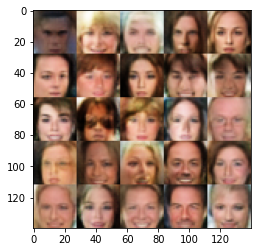

Epoch 2/3 Step 5410... Discriminator Loss: 1.1952... Generator Loss: 0.7750
Epoch 2/3 Step 5420... Discriminator Loss: 1.1723... Generator Loss: 1.0992
Epoch 2/3 Step 5430... Discriminator Loss: 1.1387... Generator Loss: 0.9171
Epoch 2/3 Step 5440... Discriminator Loss: 1.1464... Generator Loss: 0.9287
Epoch 2/3 Step 5450... Discriminator Loss: 1.1045... Generator Loss: 1.2085
Epoch 2/3 Step 5460... Discriminator Loss: 1.0663... Generator Loss: 1.2693
Epoch 2/3 Step 5470... Discriminator Loss: 1.1596... Generator Loss: 1.0602
Epoch 2/3 Step 5480... Discriminator Loss: 1.1108... Generator Loss: 1.0709
Epoch 2/3 Step 5490... Discriminator Loss: 0.9996... Generator Loss: 1.2267
Epoch 2/3 Step 5500... Discriminator Loss: 1.2729... Generator Loss: 0.6903


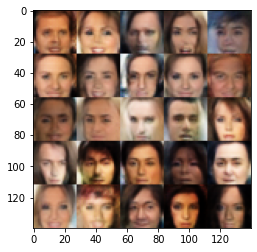

Epoch 2/3 Step 5510... Discriminator Loss: 1.0396... Generator Loss: 1.0216
Epoch 2/3 Step 5520... Discriminator Loss: 1.0800... Generator Loss: 0.9477
Epoch 2/3 Step 5530... Discriminator Loss: 1.1022... Generator Loss: 0.9209
Epoch 2/3 Step 5540... Discriminator Loss: 1.1081... Generator Loss: 1.1101
Epoch 2/3 Step 5550... Discriminator Loss: 1.0466... Generator Loss: 1.2996
Epoch 2/3 Step 5560... Discriminator Loss: 1.0634... Generator Loss: 1.0282
Epoch 2/3 Step 5570... Discriminator Loss: 1.2063... Generator Loss: 1.3346
Epoch 2/3 Step 5580... Discriminator Loss: 1.1420... Generator Loss: 0.9353
Epoch 2/3 Step 5590... Discriminator Loss: 1.1319... Generator Loss: 0.8676
Epoch 2/3 Step 5600... Discriminator Loss: 1.0580... Generator Loss: 1.1600


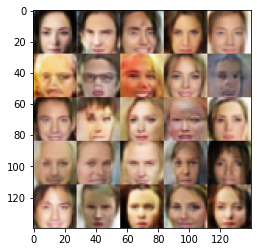

Epoch 2/3 Step 5610... Discriminator Loss: 1.0172... Generator Loss: 1.1470
Epoch 2/3 Step 5620... Discriminator Loss: 1.0317... Generator Loss: 1.2079
Epoch 2/3 Step 5630... Discriminator Loss: 1.0833... Generator Loss: 1.3042
Epoch 2/3 Step 5640... Discriminator Loss: 1.1512... Generator Loss: 0.9624
Epoch 2/3 Step 5650... Discriminator Loss: 1.1222... Generator Loss: 1.2906
Epoch 2/3 Step 5660... Discriminator Loss: 1.1542... Generator Loss: 0.8942
Epoch 2/3 Step 5670... Discriminator Loss: 1.1427... Generator Loss: 0.9554
Epoch 2/3 Step 5680... Discriminator Loss: 1.0718... Generator Loss: 1.0011
Epoch 2/3 Step 5690... Discriminator Loss: 1.0815... Generator Loss: 1.0464
Epoch 2/3 Step 5700... Discriminator Loss: 1.0417... Generator Loss: 1.0963


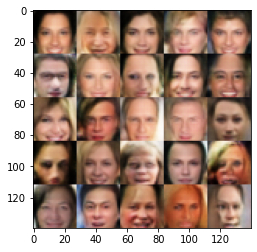

Epoch 2/3 Step 5710... Discriminator Loss: 1.0743... Generator Loss: 0.9893
Epoch 2/3 Step 5720... Discriminator Loss: 1.1162... Generator Loss: 1.3169
Epoch 2/3 Step 5730... Discriminator Loss: 1.1121... Generator Loss: 1.1656
Epoch 2/3 Step 5740... Discriminator Loss: 1.1622... Generator Loss: 0.9379
Epoch 2/3 Step 5750... Discriminator Loss: 1.0869... Generator Loss: 1.2087
Epoch 2/3 Step 5760... Discriminator Loss: 1.0398... Generator Loss: 1.2617
Epoch 2/3 Step 5770... Discriminator Loss: 1.0993... Generator Loss: 1.0413
Epoch 2/3 Step 5780... Discriminator Loss: 1.1383... Generator Loss: 1.2689
Epoch 2/3 Step 5790... Discriminator Loss: 1.1337... Generator Loss: 0.9814
Epoch 2/3 Step 5800... Discriminator Loss: 1.0615... Generator Loss: 1.0401


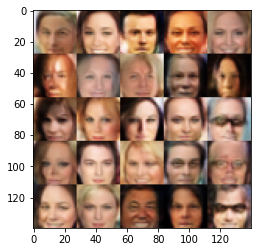

Epoch 2/3 Step 5810... Discriminator Loss: 1.0206... Generator Loss: 1.1213
Epoch 2/3 Step 5820... Discriminator Loss: 1.1031... Generator Loss: 1.0199
Epoch 2/3 Step 5830... Discriminator Loss: 1.0100... Generator Loss: 1.1249
Epoch 2/3 Step 5840... Discriminator Loss: 1.0826... Generator Loss: 0.9992
Epoch 2/3 Step 5850... Discriminator Loss: 1.1006... Generator Loss: 1.0593
Epoch 2/3 Step 5860... Discriminator Loss: 1.0527... Generator Loss: 1.0243
Epoch 2/3 Step 5870... Discriminator Loss: 1.1803... Generator Loss: 1.0941
Epoch 2/3 Step 5880... Discriminator Loss: 1.0213... Generator Loss: 1.2069
Epoch 2/3 Step 5890... Discriminator Loss: 1.0815... Generator Loss: 1.4726
Epoch 2/3 Step 5900... Discriminator Loss: 0.9859... Generator Loss: 1.1841


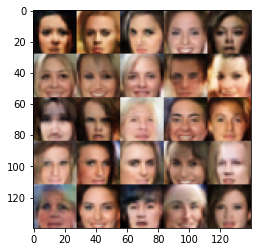

Epoch 2/3 Step 5910... Discriminator Loss: 0.9863... Generator Loss: 1.4463
Epoch 2/3 Step 5920... Discriminator Loss: 1.1583... Generator Loss: 1.2135
Epoch 2/3 Step 5930... Discriminator Loss: 1.1371... Generator Loss: 1.0250
Epoch 2/3 Step 5940... Discriminator Loss: 1.0679... Generator Loss: 0.9841
Epoch 2/3 Step 5950... Discriminator Loss: 1.0023... Generator Loss: 1.1205
Epoch 2/3 Step 5960... Discriminator Loss: 1.2493... Generator Loss: 1.6869
Epoch 2/3 Step 5970... Discriminator Loss: 1.0588... Generator Loss: 1.1159
Epoch 2/3 Step 5980... Discriminator Loss: 1.0996... Generator Loss: 1.2962
Epoch 2/3 Step 5990... Discriminator Loss: 0.9888... Generator Loss: 1.0411
Epoch 2/3 Step 6000... Discriminator Loss: 1.1333... Generator Loss: 0.8072


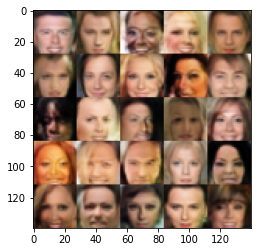

Epoch 2/3 Step 6010... Discriminator Loss: 1.0253... Generator Loss: 1.1185
Epoch 2/3 Step 6020... Discriminator Loss: 1.3002... Generator Loss: 0.8944
Epoch 2/3 Step 6030... Discriminator Loss: 1.0659... Generator Loss: 1.2303
Epoch 2/3 Step 6040... Discriminator Loss: 1.0943... Generator Loss: 0.9808
Epoch 2/3 Step 6050... Discriminator Loss: 1.1044... Generator Loss: 1.3401
Epoch 2/3 Step 6060... Discriminator Loss: 1.0566... Generator Loss: 1.2604
Epoch 2/3 Step 6070... Discriminator Loss: 1.0012... Generator Loss: 1.4044
Epoch 2/3 Step 6080... Discriminator Loss: 1.1118... Generator Loss: 1.4738
Epoch 2/3 Step 6090... Discriminator Loss: 1.0912... Generator Loss: 1.1212
Epoch 2/3 Step 6100... Discriminator Loss: 1.0402... Generator Loss: 1.2958


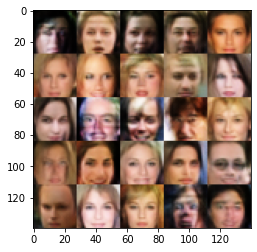

Epoch 2/3 Step 6110... Discriminator Loss: 1.0828... Generator Loss: 1.1344
Epoch 2/3 Step 6120... Discriminator Loss: 1.0200... Generator Loss: 1.2062
Epoch 2/3 Step 6130... Discriminator Loss: 1.0264... Generator Loss: 0.9251
Epoch 2/3 Step 6140... Discriminator Loss: 1.0497... Generator Loss: 1.2249
Epoch 2/3 Step 6150... Discriminator Loss: 1.1347... Generator Loss: 1.1142
Epoch 2/3 Step 6160... Discriminator Loss: 1.1042... Generator Loss: 1.6296
Epoch 2/3 Step 6170... Discriminator Loss: 1.0605... Generator Loss: 1.1074
Epoch 2/3 Step 6180... Discriminator Loss: 1.0211... Generator Loss: 1.0577
Epoch 2/3 Step 6190... Discriminator Loss: 1.0852... Generator Loss: 1.5500
Epoch 2/3 Step 6200... Discriminator Loss: 1.1281... Generator Loss: 1.2415


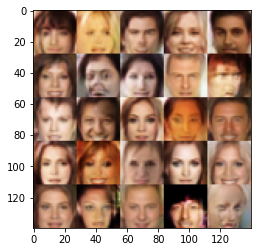

Epoch 2/3 Step 6210... Discriminator Loss: 1.0763... Generator Loss: 1.2980
Epoch 2/3 Step 6220... Discriminator Loss: 1.0616... Generator Loss: 0.9129
Epoch 2/3 Step 6230... Discriminator Loss: 1.0270... Generator Loss: 1.2937
Epoch 2/3 Step 6240... Discriminator Loss: 1.1486... Generator Loss: 1.0879
Epoch 2/3 Step 6250... Discriminator Loss: 1.0558... Generator Loss: 1.1362
Epoch 2/3 Step 6260... Discriminator Loss: 1.0700... Generator Loss: 0.9342
Epoch 2/3 Step 6270... Discriminator Loss: 1.0430... Generator Loss: 1.2484
Epoch 2/3 Step 6280... Discriminator Loss: 1.2125... Generator Loss: 0.8688
Epoch 2/3 Step 6290... Discriminator Loss: 1.0744... Generator Loss: 0.9813
Epoch 2/3 Step 6300... Discriminator Loss: 1.1425... Generator Loss: 1.1353


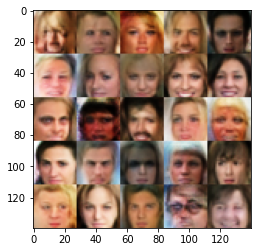

Epoch 2/3 Step 6310... Discriminator Loss: 1.0975... Generator Loss: 1.3019
Epoch 2/3 Step 6320... Discriminator Loss: 1.2082... Generator Loss: 1.2516
Epoch 2/3 Step 6330... Discriminator Loss: 1.1404... Generator Loss: 1.5485
Epoch 3/3 Step 6340... Discriminator Loss: 1.0195... Generator Loss: 1.1180
Epoch 3/3 Step 6350... Discriminator Loss: 1.0955... Generator Loss: 1.3193
Epoch 3/3 Step 6360... Discriminator Loss: 1.0482... Generator Loss: 1.0893
Epoch 3/3 Step 6370... Discriminator Loss: 1.0250... Generator Loss: 1.3978
Epoch 3/3 Step 6380... Discriminator Loss: 1.0718... Generator Loss: 1.2993
Epoch 3/3 Step 6390... Discriminator Loss: 1.0582... Generator Loss: 1.3161
Epoch 3/3 Step 6400... Discriminator Loss: 1.0820... Generator Loss: 1.5304


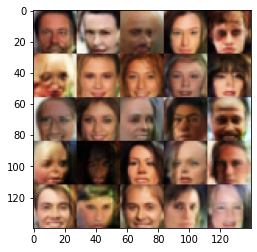

Epoch 3/3 Step 6410... Discriminator Loss: 1.1409... Generator Loss: 1.9435
Epoch 3/3 Step 6420... Discriminator Loss: 1.0896... Generator Loss: 1.1162
Epoch 3/3 Step 6430... Discriminator Loss: 1.1830... Generator Loss: 1.7010
Epoch 3/3 Step 6440... Discriminator Loss: 1.0381... Generator Loss: 1.1344
Epoch 3/3 Step 6450... Discriminator Loss: 1.0110... Generator Loss: 1.3065
Epoch 3/3 Step 6460... Discriminator Loss: 1.0741... Generator Loss: 1.0519
Epoch 3/3 Step 6470... Discriminator Loss: 1.0750... Generator Loss: 1.1956
Epoch 3/3 Step 6480... Discriminator Loss: 1.1248... Generator Loss: 1.2701
Epoch 3/3 Step 6490... Discriminator Loss: 1.0794... Generator Loss: 0.9482
Epoch 3/3 Step 6500... Discriminator Loss: 1.0768... Generator Loss: 1.2755


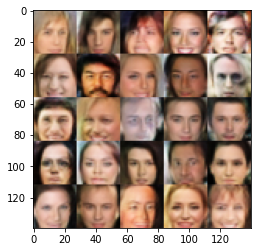

Epoch 3/3 Step 6510... Discriminator Loss: 1.0998... Generator Loss: 1.1018
Epoch 3/3 Step 6520... Discriminator Loss: 1.0577... Generator Loss: 0.9844
Epoch 3/3 Step 6530... Discriminator Loss: 1.1239... Generator Loss: 1.1731
Epoch 3/3 Step 6540... Discriminator Loss: 1.5029... Generator Loss: 1.8912
Epoch 3/3 Step 6550... Discriminator Loss: 1.0591... Generator Loss: 1.1746
Epoch 3/3 Step 6560... Discriminator Loss: 1.0420... Generator Loss: 1.2026
Epoch 3/3 Step 6570... Discriminator Loss: 1.1257... Generator Loss: 1.0089
Epoch 3/3 Step 6580... Discriminator Loss: 1.0358... Generator Loss: 1.1630
Epoch 3/3 Step 6590... Discriminator Loss: 1.1075... Generator Loss: 0.9568
Epoch 3/3 Step 6600... Discriminator Loss: 1.1173... Generator Loss: 0.9890


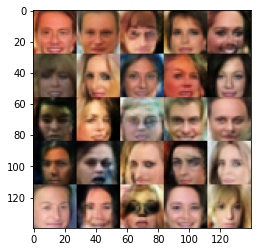

Epoch 3/3 Step 6610... Discriminator Loss: 1.0723... Generator Loss: 1.5525
Epoch 3/3 Step 6620... Discriminator Loss: 1.0772... Generator Loss: 1.2491
Epoch 3/3 Step 6630... Discriminator Loss: 1.0148... Generator Loss: 1.3588
Epoch 3/3 Step 6640... Discriminator Loss: 0.9527... Generator Loss: 1.2771
Epoch 3/3 Step 6650... Discriminator Loss: 1.1308... Generator Loss: 1.7925
Epoch 3/3 Step 6660... Discriminator Loss: 1.0996... Generator Loss: 1.0511
Epoch 3/3 Step 6670... Discriminator Loss: 1.0584... Generator Loss: 1.2655
Epoch 3/3 Step 6680... Discriminator Loss: 1.0492... Generator Loss: 0.9751
Epoch 3/3 Step 6690... Discriminator Loss: 1.0212... Generator Loss: 1.0522
Epoch 3/3 Step 6700... Discriminator Loss: 1.0729... Generator Loss: 1.4410


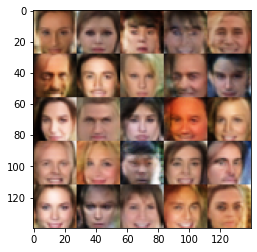

Epoch 3/3 Step 6710... Discriminator Loss: 1.1146... Generator Loss: 1.5832
Epoch 3/3 Step 6720... Discriminator Loss: 1.0691... Generator Loss: 0.9817
Epoch 3/3 Step 6730... Discriminator Loss: 1.0235... Generator Loss: 0.9390
Epoch 3/3 Step 6740... Discriminator Loss: 0.9789... Generator Loss: 1.1972
Epoch 3/3 Step 6750... Discriminator Loss: 1.0821... Generator Loss: 1.3434
Epoch 3/3 Step 6760... Discriminator Loss: 1.2594... Generator Loss: 2.0266
Epoch 3/3 Step 6770... Discriminator Loss: 1.0616... Generator Loss: 1.2391
Epoch 3/3 Step 6780... Discriminator Loss: 1.0739... Generator Loss: 1.0967
Epoch 3/3 Step 6790... Discriminator Loss: 0.9904... Generator Loss: 1.3329
Epoch 3/3 Step 6800... Discriminator Loss: 0.9793... Generator Loss: 1.0775


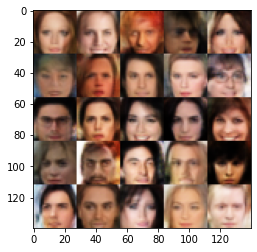

Epoch 3/3 Step 6810... Discriminator Loss: 0.9740... Generator Loss: 1.4086
Epoch 3/3 Step 6820... Discriminator Loss: 0.9410... Generator Loss: 1.3094
Epoch 3/3 Step 6830... Discriminator Loss: 1.0755... Generator Loss: 1.6118
Epoch 3/3 Step 6840... Discriminator Loss: 1.2028... Generator Loss: 1.7503
Epoch 3/3 Step 6850... Discriminator Loss: 0.9613... Generator Loss: 1.3312
Epoch 3/3 Step 6860... Discriminator Loss: 1.1038... Generator Loss: 0.8839
Epoch 3/3 Step 6870... Discriminator Loss: 1.0853... Generator Loss: 1.2308
Epoch 3/3 Step 6880... Discriminator Loss: 1.2776... Generator Loss: 0.7757
Epoch 3/3 Step 6890... Discriminator Loss: 1.0326... Generator Loss: 1.1155
Epoch 3/3 Step 6900... Discriminator Loss: 1.0638... Generator Loss: 1.0024


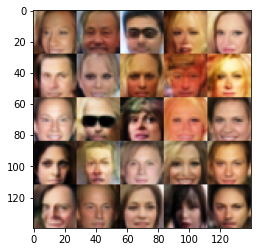

Epoch 3/3 Step 6910... Discriminator Loss: 1.0091... Generator Loss: 1.0103
Epoch 3/3 Step 6920... Discriminator Loss: 1.2052... Generator Loss: 0.9941
Epoch 3/3 Step 6930... Discriminator Loss: 1.1917... Generator Loss: 0.8939
Epoch 3/3 Step 6940... Discriminator Loss: 1.1276... Generator Loss: 1.5575
Epoch 3/3 Step 6950... Discriminator Loss: 1.0413... Generator Loss: 1.0665
Epoch 3/3 Step 6960... Discriminator Loss: 1.0511... Generator Loss: 1.1217
Epoch 3/3 Step 6970... Discriminator Loss: 1.1111... Generator Loss: 1.6041
Epoch 3/3 Step 6980... Discriminator Loss: 1.0037... Generator Loss: 1.4784
Epoch 3/3 Step 6990... Discriminator Loss: 1.1033... Generator Loss: 1.2299
Epoch 3/3 Step 7000... Discriminator Loss: 1.0303... Generator Loss: 1.1207


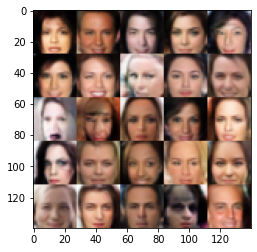

Epoch 3/3 Step 7010... Discriminator Loss: 0.9851... Generator Loss: 1.3887
Epoch 3/3 Step 7020... Discriminator Loss: 1.0419... Generator Loss: 1.2488
Epoch 3/3 Step 7030... Discriminator Loss: 0.9694... Generator Loss: 1.7343
Epoch 3/3 Step 7040... Discriminator Loss: 1.0269... Generator Loss: 1.0835
Epoch 3/3 Step 7050... Discriminator Loss: 1.1418... Generator Loss: 1.5319
Epoch 3/3 Step 7060... Discriminator Loss: 1.0668... Generator Loss: 1.0817
Epoch 3/3 Step 7070... Discriminator Loss: 1.0376... Generator Loss: 1.1458
Epoch 3/3 Step 7080... Discriminator Loss: 1.1270... Generator Loss: 1.1077
Epoch 3/3 Step 7090... Discriminator Loss: 1.0370... Generator Loss: 1.2036
Epoch 3/3 Step 7100... Discriminator Loss: 1.1140... Generator Loss: 1.5218


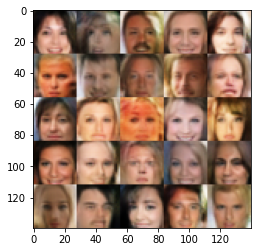

Epoch 3/3 Step 7110... Discriminator Loss: 1.0529... Generator Loss: 1.1345
Epoch 3/3 Step 7120... Discriminator Loss: 1.0303... Generator Loss: 1.2883
Epoch 3/3 Step 7130... Discriminator Loss: 1.1557... Generator Loss: 0.9914
Epoch 3/3 Step 7140... Discriminator Loss: 0.9718... Generator Loss: 1.2336
Epoch 3/3 Step 7150... Discriminator Loss: 1.3601... Generator Loss: 0.6299
Epoch 3/3 Step 7160... Discriminator Loss: 1.0307... Generator Loss: 1.1943
Epoch 3/3 Step 7170... Discriminator Loss: 0.9982... Generator Loss: 1.1483
Epoch 3/3 Step 7180... Discriminator Loss: 1.0476... Generator Loss: 0.9769
Epoch 3/3 Step 7190... Discriminator Loss: 0.9798... Generator Loss: 1.0536
Epoch 3/3 Step 7200... Discriminator Loss: 0.9402... Generator Loss: 1.3049


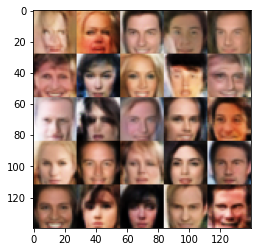

Epoch 3/3 Step 7210... Discriminator Loss: 0.9733... Generator Loss: 1.2962
Epoch 3/3 Step 7220... Discriminator Loss: 0.9526... Generator Loss: 1.1707
Epoch 3/3 Step 7230... Discriminator Loss: 1.2008... Generator Loss: 1.7694
Epoch 3/3 Step 7240... Discriminator Loss: 1.0532... Generator Loss: 1.0925
Epoch 3/3 Step 7250... Discriminator Loss: 0.9973... Generator Loss: 1.1551
Epoch 3/3 Step 7260... Discriminator Loss: 1.1131... Generator Loss: 0.9173
Epoch 3/3 Step 7270... Discriminator Loss: 0.9660... Generator Loss: 1.3089
Epoch 3/3 Step 7280... Discriminator Loss: 1.0344... Generator Loss: 1.1364
Epoch 3/3 Step 7290... Discriminator Loss: 1.0136... Generator Loss: 1.0752
Epoch 3/3 Step 7300... Discriminator Loss: 1.0854... Generator Loss: 1.0339


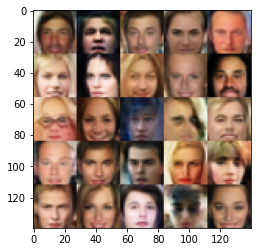

Epoch 3/3 Step 7310... Discriminator Loss: 0.9369... Generator Loss: 1.2492
Epoch 3/3 Step 7320... Discriminator Loss: 1.0477... Generator Loss: 1.2347
Epoch 3/3 Step 7330... Discriminator Loss: 1.0516... Generator Loss: 1.0149
Epoch 3/3 Step 7340... Discriminator Loss: 0.9996... Generator Loss: 1.0713
Epoch 3/3 Step 7350... Discriminator Loss: 1.0293... Generator Loss: 1.5775
Epoch 3/3 Step 7360... Discriminator Loss: 1.0121... Generator Loss: 1.2395
Epoch 3/3 Step 7370... Discriminator Loss: 1.0474... Generator Loss: 1.5344
Epoch 3/3 Step 7380... Discriminator Loss: 0.9409... Generator Loss: 1.2569
Epoch 3/3 Step 7390... Discriminator Loss: 0.9737... Generator Loss: 1.2669
Epoch 3/3 Step 7400... Discriminator Loss: 1.0901... Generator Loss: 0.9559


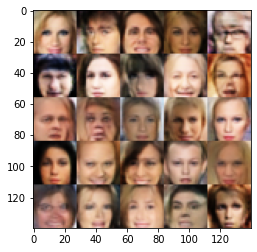

Epoch 3/3 Step 7410... Discriminator Loss: 0.9901... Generator Loss: 1.2635
Epoch 3/3 Step 7420... Discriminator Loss: 1.0157... Generator Loss: 1.2095
Epoch 3/3 Step 7430... Discriminator Loss: 1.0324... Generator Loss: 1.2812
Epoch 3/3 Step 7440... Discriminator Loss: 1.1166... Generator Loss: 1.4143
Epoch 3/3 Step 7450... Discriminator Loss: 1.0351... Generator Loss: 0.9683
Epoch 3/3 Step 7460... Discriminator Loss: 1.0730... Generator Loss: 0.9498
Epoch 3/3 Step 7470... Discriminator Loss: 0.9477... Generator Loss: 1.3409
Epoch 3/3 Step 7480... Discriminator Loss: 0.9866... Generator Loss: 1.2534
Epoch 3/3 Step 7490... Discriminator Loss: 1.0852... Generator Loss: 1.5771
Epoch 3/3 Step 7500... Discriminator Loss: 1.0389... Generator Loss: 1.3569


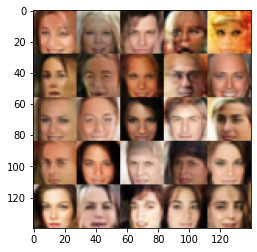

Epoch 3/3 Step 7510... Discriminator Loss: 1.0269... Generator Loss: 1.1789
Epoch 3/3 Step 7520... Discriminator Loss: 1.0452... Generator Loss: 1.3786
Epoch 3/3 Step 7530... Discriminator Loss: 1.1778... Generator Loss: 1.0177
Epoch 3/3 Step 7540... Discriminator Loss: 0.9805... Generator Loss: 1.3137
Epoch 3/3 Step 7550... Discriminator Loss: 0.9949... Generator Loss: 1.1338
Epoch 3/3 Step 7560... Discriminator Loss: 1.0062... Generator Loss: 1.2193
Epoch 3/3 Step 7570... Discriminator Loss: 0.9409... Generator Loss: 1.3364
Epoch 3/3 Step 7580... Discriminator Loss: 1.0022... Generator Loss: 1.1384
Epoch 3/3 Step 7590... Discriminator Loss: 1.0004... Generator Loss: 1.0505
Epoch 3/3 Step 7600... Discriminator Loss: 0.9668... Generator Loss: 1.5465


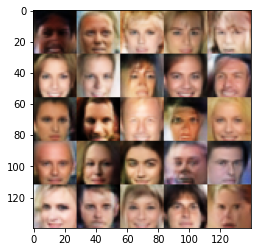

Epoch 3/3 Step 7610... Discriminator Loss: 0.9939... Generator Loss: 1.1061
Epoch 3/3 Step 7620... Discriminator Loss: 1.1295... Generator Loss: 1.7746
Epoch 3/3 Step 7630... Discriminator Loss: 0.9632... Generator Loss: 1.2276
Epoch 3/3 Step 7640... Discriminator Loss: 1.0000... Generator Loss: 1.1010
Epoch 3/3 Step 7650... Discriminator Loss: 1.0725... Generator Loss: 1.1679
Epoch 3/3 Step 7660... Discriminator Loss: 1.0189... Generator Loss: 1.1400
Epoch 3/3 Step 7670... Discriminator Loss: 1.1584... Generator Loss: 1.7793
Epoch 3/3 Step 7680... Discriminator Loss: 1.0073... Generator Loss: 1.3602
Epoch 3/3 Step 7690... Discriminator Loss: 1.1562... Generator Loss: 0.8155
Epoch 3/3 Step 7700... Discriminator Loss: 0.9582... Generator Loss: 1.2622


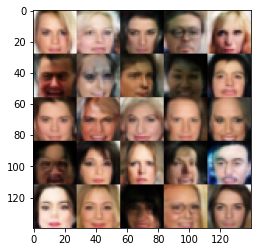

Epoch 3/3 Step 7710... Discriminator Loss: 1.0337... Generator Loss: 1.0239
Epoch 3/3 Step 7720... Discriminator Loss: 1.1344... Generator Loss: 1.8401
Epoch 3/3 Step 7730... Discriminator Loss: 0.9052... Generator Loss: 1.5883
Epoch 3/3 Step 7740... Discriminator Loss: 0.9796... Generator Loss: 1.3828
Epoch 3/3 Step 7750... Discriminator Loss: 1.0292... Generator Loss: 1.0533
Epoch 3/3 Step 7760... Discriminator Loss: 0.9315... Generator Loss: 1.2400
Epoch 3/3 Step 7770... Discriminator Loss: 0.9318... Generator Loss: 1.3844
Epoch 3/3 Step 7780... Discriminator Loss: 0.9238... Generator Loss: 1.2201
Epoch 3/3 Step 7790... Discriminator Loss: 0.9881... Generator Loss: 1.2789
Epoch 3/3 Step 7800... Discriminator Loss: 1.0089... Generator Loss: 1.5294


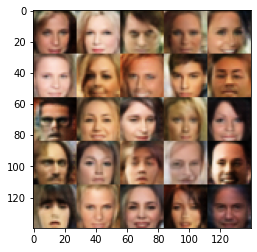

Epoch 3/3 Step 7810... Discriminator Loss: 0.9772... Generator Loss: 1.4297
Epoch 3/3 Step 7820... Discriminator Loss: 0.9863... Generator Loss: 1.1303
Epoch 3/3 Step 7830... Discriminator Loss: 1.0192... Generator Loss: 1.1496
Epoch 3/3 Step 7840... Discriminator Loss: 1.0208... Generator Loss: 1.0422
Epoch 3/3 Step 7850... Discriminator Loss: 0.9307... Generator Loss: 1.2825
Epoch 3/3 Step 7860... Discriminator Loss: 1.0044... Generator Loss: 0.9928
Epoch 3/3 Step 7870... Discriminator Loss: 0.9766... Generator Loss: 1.2769
Epoch 3/3 Step 7880... Discriminator Loss: 1.2202... Generator Loss: 0.7724
Epoch 3/3 Step 7890... Discriminator Loss: 0.9663... Generator Loss: 1.2067
Epoch 3/3 Step 7900... Discriminator Loss: 1.0421... Generator Loss: 1.2913


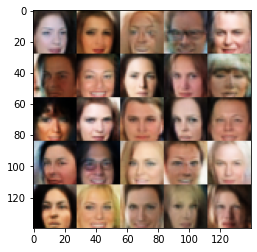

Epoch 3/3 Step 7910... Discriminator Loss: 1.0733... Generator Loss: 1.0172
Epoch 3/3 Step 7920... Discriminator Loss: 1.0491... Generator Loss: 1.1079
Epoch 3/3 Step 7930... Discriminator Loss: 1.0525... Generator Loss: 1.3546
Epoch 3/3 Step 7940... Discriminator Loss: 0.9998... Generator Loss: 1.2164
Epoch 3/3 Step 7950... Discriminator Loss: 0.9966... Generator Loss: 1.0690
Epoch 3/3 Step 7960... Discriminator Loss: 1.0262... Generator Loss: 1.4117
Epoch 3/3 Step 7970... Discriminator Loss: 0.9650... Generator Loss: 1.0720
Epoch 3/3 Step 7980... Discriminator Loss: 1.0204... Generator Loss: 1.0589
Epoch 3/3 Step 7990... Discriminator Loss: 1.1356... Generator Loss: 0.8441
Epoch 3/3 Step 8000... Discriminator Loss: 1.0576... Generator Loss: 1.2021


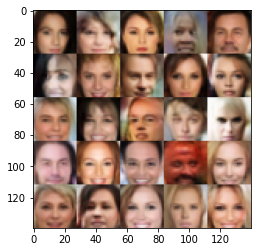

Epoch 3/3 Step 8010... Discriminator Loss: 1.0053... Generator Loss: 1.0352
Epoch 3/3 Step 8020... Discriminator Loss: 1.0151... Generator Loss: 1.7160
Epoch 3/3 Step 8030... Discriminator Loss: 1.0994... Generator Loss: 1.4075
Epoch 3/3 Step 8040... Discriminator Loss: 0.9120... Generator Loss: 1.7079
Epoch 3/3 Step 8050... Discriminator Loss: 1.0394... Generator Loss: 1.5508
Epoch 3/3 Step 8060... Discriminator Loss: 1.0062... Generator Loss: 1.1673
Epoch 3/3 Step 8070... Discriminator Loss: 1.6317... Generator Loss: 2.2829
Epoch 3/3 Step 8080... Discriminator Loss: 1.1041... Generator Loss: 1.0249
Epoch 3/3 Step 8090... Discriminator Loss: 1.0201... Generator Loss: 1.5101
Epoch 3/3 Step 8100... Discriminator Loss: 1.0982... Generator Loss: 1.8732


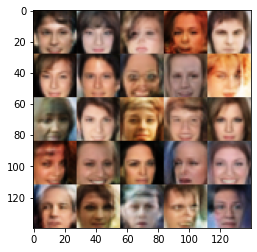

Epoch 3/3 Step 8110... Discriminator Loss: 0.9044... Generator Loss: 1.1769
Epoch 3/3 Step 8120... Discriminator Loss: 0.9662... Generator Loss: 1.2200
Epoch 3/3 Step 8130... Discriminator Loss: 1.0515... Generator Loss: 1.4639
Epoch 3/3 Step 8140... Discriminator Loss: 1.0286... Generator Loss: 1.7884
Epoch 3/3 Step 8150... Discriminator Loss: 0.8967... Generator Loss: 1.2925
Epoch 3/3 Step 8160... Discriminator Loss: 1.0232... Generator Loss: 1.7019
Epoch 3/3 Step 8170... Discriminator Loss: 1.0051... Generator Loss: 1.4519
Epoch 3/3 Step 8180... Discriminator Loss: 0.9849... Generator Loss: 1.4764
Epoch 3/3 Step 8190... Discriminator Loss: 1.0469... Generator Loss: 1.2946
Epoch 3/3 Step 8200... Discriminator Loss: 1.0524... Generator Loss: 0.9055


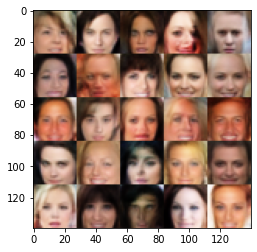

Epoch 3/3 Step 8210... Discriminator Loss: 1.0525... Generator Loss: 0.9488
Epoch 3/3 Step 8220... Discriminator Loss: 0.9643... Generator Loss: 1.2746
Epoch 3/3 Step 8230... Discriminator Loss: 1.0860... Generator Loss: 0.9077
Epoch 3/3 Step 8240... Discriminator Loss: 0.9889... Generator Loss: 1.7577
Epoch 3/3 Step 8250... Discriminator Loss: 0.9797... Generator Loss: 1.4447
Epoch 3/3 Step 8260... Discriminator Loss: 0.9501... Generator Loss: 1.3628
Epoch 3/3 Step 8270... Discriminator Loss: 1.0013... Generator Loss: 1.0302
Epoch 3/3 Step 8280... Discriminator Loss: 0.9917... Generator Loss: 1.2539
Epoch 3/3 Step 8290... Discriminator Loss: 1.1090... Generator Loss: 0.9624
Epoch 3/3 Step 8300... Discriminator Loss: 0.9769... Generator Loss: 1.3056


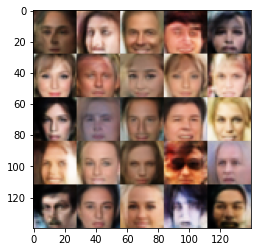

Epoch 3/3 Step 8310... Discriminator Loss: 0.9691... Generator Loss: 1.0084
Epoch 3/3 Step 8320... Discriminator Loss: 0.9326... Generator Loss: 1.3246
Epoch 3/3 Step 8330... Discriminator Loss: 1.0409... Generator Loss: 1.7195
Epoch 3/3 Step 8340... Discriminator Loss: 0.9556... Generator Loss: 1.1731
Epoch 3/3 Step 8350... Discriminator Loss: 0.9541... Generator Loss: 1.0912
Epoch 3/3 Step 8360... Discriminator Loss: 1.0548... Generator Loss: 0.8924
Epoch 3/3 Step 8370... Discriminator Loss: 0.9105... Generator Loss: 1.3484
Epoch 3/3 Step 8380... Discriminator Loss: 0.8935... Generator Loss: 1.3679
Epoch 3/3 Step 8390... Discriminator Loss: 0.9602... Generator Loss: 1.7085
Epoch 3/3 Step 8400... Discriminator Loss: 1.0663... Generator Loss: 1.5400


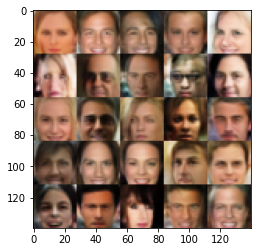

Epoch 3/3 Step 8410... Discriminator Loss: 0.9022... Generator Loss: 1.4002
Epoch 3/3 Step 8420... Discriminator Loss: 1.0218... Generator Loss: 1.1661
Epoch 3/3 Step 8430... Discriminator Loss: 1.0809... Generator Loss: 0.9379
Epoch 3/3 Step 8440... Discriminator Loss: 0.9124... Generator Loss: 1.3645
Epoch 3/3 Step 8450... Discriminator Loss: 1.0167... Generator Loss: 1.1223
Epoch 3/3 Step 8460... Discriminator Loss: 0.9477... Generator Loss: 1.5502
Epoch 3/3 Step 8470... Discriminator Loss: 1.0106... Generator Loss: 1.0778
Epoch 3/3 Step 8480... Discriminator Loss: 1.1942... Generator Loss: 1.9752
Epoch 3/3 Step 8490... Discriminator Loss: 1.0752... Generator Loss: 0.9090
Epoch 3/3 Step 8500... Discriminator Loss: 1.1647... Generator Loss: 1.7814


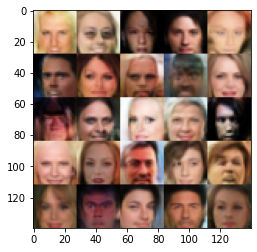

Epoch 3/3 Step 8510... Discriminator Loss: 0.9583... Generator Loss: 1.1798
Epoch 3/3 Step 8520... Discriminator Loss: 0.9131... Generator Loss: 1.2372
Epoch 3/3 Step 8530... Discriminator Loss: 0.8918... Generator Loss: 1.2612
Epoch 3/3 Step 8540... Discriminator Loss: 1.0755... Generator Loss: 1.8583
Epoch 3/3 Step 8550... Discriminator Loss: 1.1191... Generator Loss: 1.8897
Epoch 3/3 Step 8560... Discriminator Loss: 0.8890... Generator Loss: 1.3246
Epoch 3/3 Step 8570... Discriminator Loss: 0.9313... Generator Loss: 1.3021
Epoch 3/3 Step 8580... Discriminator Loss: 0.9780... Generator Loss: 1.2899
Epoch 3/3 Step 8590... Discriminator Loss: 1.0777... Generator Loss: 1.0429
Epoch 3/3 Step 8600... Discriminator Loss: 1.0195... Generator Loss: 1.0116


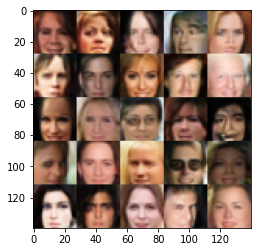

Epoch 3/3 Step 8610... Discriminator Loss: 0.9400... Generator Loss: 1.1447
Epoch 3/3 Step 8620... Discriminator Loss: 1.0368... Generator Loss: 0.9613
Epoch 3/3 Step 8630... Discriminator Loss: 1.0258... Generator Loss: 1.5876
Epoch 3/3 Step 8640... Discriminator Loss: 0.9173... Generator Loss: 1.6676
Epoch 3/3 Step 8650... Discriminator Loss: 0.9274... Generator Loss: 1.4702
Epoch 3/3 Step 8660... Discriminator Loss: 1.0222... Generator Loss: 1.7450
Epoch 3/3 Step 8670... Discriminator Loss: 0.9305... Generator Loss: 1.2424
Epoch 3/3 Step 8680... Discriminator Loss: 0.9427... Generator Loss: 1.4247
Epoch 3/3 Step 8690... Discriminator Loss: 0.9856... Generator Loss: 1.3209
Epoch 3/3 Step 8700... Discriminator Loss: 0.9607... Generator Loss: 1.1253


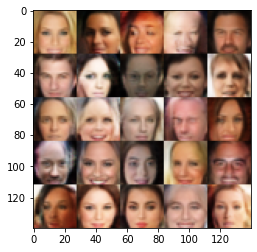

Epoch 3/3 Step 8710... Discriminator Loss: 0.9550... Generator Loss: 1.2904
Epoch 3/3 Step 8720... Discriminator Loss: 0.9911... Generator Loss: 1.0931
Epoch 3/3 Step 8730... Discriminator Loss: 0.9343... Generator Loss: 1.1211
Epoch 3/3 Step 8740... Discriminator Loss: 0.9264... Generator Loss: 1.3942
Epoch 3/3 Step 8750... Discriminator Loss: 1.0156... Generator Loss: 1.4927
Epoch 3/3 Step 8760... Discriminator Loss: 0.9714... Generator Loss: 1.2448
Epoch 3/3 Step 8770... Discriminator Loss: 1.0852... Generator Loss: 1.1533
Epoch 3/3 Step 8780... Discriminator Loss: 0.9429... Generator Loss: 1.4262
Epoch 3/3 Step 8790... Discriminator Loss: 0.9652... Generator Loss: 1.5732
Epoch 3/3 Step 8800... Discriminator Loss: 1.1324... Generator Loss: 0.8644


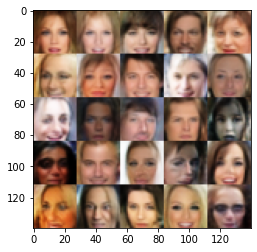

Epoch 3/3 Step 8810... Discriminator Loss: 1.1065... Generator Loss: 0.9184
Epoch 3/3 Step 8820... Discriminator Loss: 0.9978... Generator Loss: 1.2019
Epoch 3/3 Step 8830... Discriminator Loss: 0.9974... Generator Loss: 1.4089
Epoch 3/3 Step 8840... Discriminator Loss: 0.9640... Generator Loss: 1.1853
Epoch 3/3 Step 8850... Discriminator Loss: 0.8963... Generator Loss: 1.3918
Epoch 3/3 Step 8860... Discriminator Loss: 0.9388... Generator Loss: 1.7758
Epoch 3/3 Step 8870... Discriminator Loss: 0.9103... Generator Loss: 1.2910
Epoch 3/3 Step 8880... Discriminator Loss: 0.9313... Generator Loss: 1.4019
Epoch 3/3 Step 8890... Discriminator Loss: 0.9392... Generator Loss: 1.2480
Epoch 3/3 Step 8900... Discriminator Loss: 0.9341... Generator Loss: 1.3030


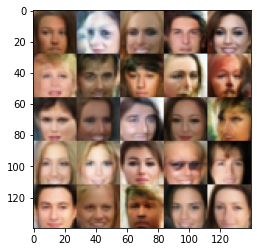

Epoch 3/3 Step 8910... Discriminator Loss: 1.0417... Generator Loss: 1.6971
Epoch 3/3 Step 8920... Discriminator Loss: 0.9510... Generator Loss: 1.3579
Epoch 3/3 Step 8930... Discriminator Loss: 1.2716... Generator Loss: 0.7193
Epoch 3/3 Step 8940... Discriminator Loss: 0.9353... Generator Loss: 1.6298
Epoch 3/3 Step 8950... Discriminator Loss: 0.9107... Generator Loss: 1.4058
Epoch 3/3 Step 8960... Discriminator Loss: 1.0808... Generator Loss: 1.7449
Epoch 3/3 Step 8970... Discriminator Loss: 1.0200... Generator Loss: 1.1842
Epoch 3/3 Step 8980... Discriminator Loss: 1.0651... Generator Loss: 0.8278
Epoch 3/3 Step 8990... Discriminator Loss: 1.1210... Generator Loss: 0.8922
Epoch 3/3 Step 9000... Discriminator Loss: 0.9040... Generator Loss: 1.7526


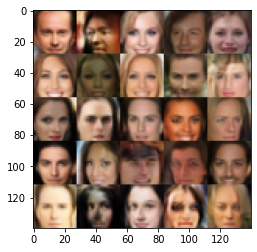

Epoch 3/3 Step 9010... Discriminator Loss: 1.0052... Generator Loss: 1.0354
Epoch 3/3 Step 9020... Discriminator Loss: 0.9625... Generator Loss: 1.3514
Epoch 3/3 Step 9030... Discriminator Loss: 0.9536... Generator Loss: 1.3636
Epoch 3/3 Step 9040... Discriminator Loss: 0.9550... Generator Loss: 1.2710
Epoch 3/3 Step 9050... Discriminator Loss: 0.9249... Generator Loss: 1.4366
Epoch 3/3 Step 9060... Discriminator Loss: 0.8744... Generator Loss: 1.3670
Epoch 3/3 Step 9070... Discriminator Loss: 0.9315... Generator Loss: 1.2684
Epoch 3/3 Step 9080... Discriminator Loss: 0.9551... Generator Loss: 1.2170
Epoch 3/3 Step 9090... Discriminator Loss: 0.9523... Generator Loss: 1.8018
Epoch 3/3 Step 9100... Discriminator Loss: 0.9796... Generator Loss: 1.0774


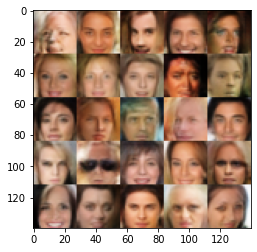

Epoch 3/3 Step 9110... Discriminator Loss: 0.9483... Generator Loss: 1.4034
Epoch 3/3 Step 9120... Discriminator Loss: 1.0780... Generator Loss: 1.0669
Epoch 3/3 Step 9130... Discriminator Loss: 0.9947... Generator Loss: 1.2538
Epoch 3/3 Step 9140... Discriminator Loss: 0.9895... Generator Loss: 1.3515
Epoch 3/3 Step 9150... Discriminator Loss: 0.9265... Generator Loss: 1.1758
Epoch 3/3 Step 9160... Discriminator Loss: 0.9828... Generator Loss: 1.6207
Epoch 3/3 Step 9170... Discriminator Loss: 1.3959... Generator Loss: 2.3686
Epoch 3/3 Step 9180... Discriminator Loss: 0.8922... Generator Loss: 1.2916
Epoch 3/3 Step 9190... Discriminator Loss: 1.0466... Generator Loss: 1.0318
Epoch 3/3 Step 9200... Discriminator Loss: 1.0817... Generator Loss: 1.6448


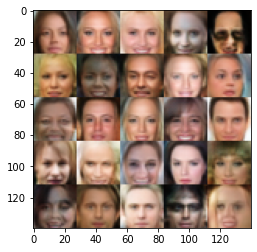

Epoch 3/3 Step 9210... Discriminator Loss: 0.9945... Generator Loss: 1.0499
Epoch 3/3 Step 9220... Discriminator Loss: 1.0259... Generator Loss: 1.3075
Epoch 3/3 Step 9230... Discriminator Loss: 0.9054... Generator Loss: 1.4738
Epoch 3/3 Step 9240... Discriminator Loss: 0.8975... Generator Loss: 1.1130
Epoch 3/3 Step 9250... Discriminator Loss: 1.0460... Generator Loss: 1.8272
Epoch 3/3 Step 9260... Discriminator Loss: 1.2929... Generator Loss: 0.6703
Epoch 3/3 Step 9270... Discriminator Loss: 0.8897... Generator Loss: 1.3505
Epoch 3/3 Step 9280... Discriminator Loss: 0.9348... Generator Loss: 1.9348
Epoch 3/3 Step 9290... Discriminator Loss: 1.2420... Generator Loss: 0.7022
Epoch 3/3 Step 9300... Discriminator Loss: 0.9226... Generator Loss: 1.5712


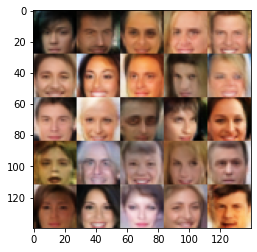

Epoch 3/3 Step 9310... Discriminator Loss: 0.9805... Generator Loss: 1.5832
Epoch 3/3 Step 9320... Discriminator Loss: 0.9492... Generator Loss: 1.4374
Epoch 3/3 Step 9330... Discriminator Loss: 0.8496... Generator Loss: 1.5251
Epoch 3/3 Step 9340... Discriminator Loss: 0.9188... Generator Loss: 1.5835
Epoch 3/3 Step 9350... Discriminator Loss: 1.0229... Generator Loss: 1.0024
Epoch 3/3 Step 9360... Discriminator Loss: 0.8584... Generator Loss: 1.2548
Epoch 3/3 Step 9370... Discriminator Loss: 1.1062... Generator Loss: 1.7138
Epoch 3/3 Step 9380... Discriminator Loss: 0.9617... Generator Loss: 0.9895
Epoch 3/3 Step 9390... Discriminator Loss: 0.9763... Generator Loss: 1.2644
Epoch 3/3 Step 9400... Discriminator Loss: 1.1453... Generator Loss: 0.8345


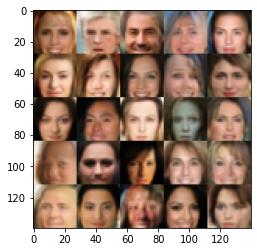

Epoch 3/3 Step 9410... Discriminator Loss: 0.8340... Generator Loss: 1.6213
Epoch 3/3 Step 9420... Discriminator Loss: 0.9454... Generator Loss: 1.2797
Epoch 3/3 Step 9430... Discriminator Loss: 0.9094... Generator Loss: 1.3002
Epoch 3/3 Step 9440... Discriminator Loss: 0.9875... Generator Loss: 1.5403
Epoch 3/3 Step 9450... Discriminator Loss: 0.9532... Generator Loss: 1.1438
Epoch 3/3 Step 9460... Discriminator Loss: 0.9877... Generator Loss: 1.1552
Epoch 3/3 Step 9470... Discriminator Loss: 0.9888... Generator Loss: 1.2175
Epoch 3/3 Step 9480... Discriminator Loss: 0.8303... Generator Loss: 1.4734
Epoch 3/3 Step 9490... Discriminator Loss: 0.9677... Generator Loss: 1.0051


In [15]:
batch_size = 64
z_dim = 100
learning_rate = 0.00025
beta1 = 0.45

epochs = 3

celeba_dataset = Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

In [0]:
# Thanks
# FarrokhKarimi